 # Squipy Xenium spatial melanoma neighbourhood and gene of interest analysis

## Import packages

In [32]:

import anndata as ad
import os
import numpy as np
import pandas as pd

import spatialdata as sd
from spatialdata_io import xenium

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq

from pathlib import Path
import shutil

import squidpy as sq
from IPython.display import display
import warnings
warnings.filterwarnings("ignore") 

import scipy.sparse as sparse
from scipy.io import mmread
from scipy.stats import pearsonr, pointbiserialr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib import rc_context

# import scanpy as sc
# sc.logging.print_header()
# sc.set_figure_params(facecolor="white", figsize=(8, 8))
# sc.settings.verbosity = 1 # errors (0), warnings (1), info (2), hints (3)
# plt.rcParams["font.family"] = "Arial"
# sns.set_style("white")

import random
# Note that BANKSY itself is deterministic, here the seeds affect the umap clusters and leiden partition
seed = 1234
np.random.seed(seed)
random.seed(seed)

#import dask
#dask.config.set({"dataframe.query-planning": True})

## Set file paths and read in xenium data

In [33]:
## Set the dataset_name and related settings to use during this analysis
dataset_name = "GR_lung_non_res_roi"

pca_label = "35"
pca_dims = int(pca_label)
pca_dims = [pca_dims]

lambda_label = "0.20"
lambda_list = [float(lambda_label)]

res_label = "0.50"
resolutions = [float(res_label)]

nbr_weight_decay = "scaled_gaussian"

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('x', 'y', 'xy')

In [34]:
## Create a base path
base_dir = "data/xenium"

## Create a path to the raw data e.g., unprocessed anndata files
raw_path = os.path.join(base_dir,f"raw_data")

if not os.path.isdir(raw_path):
    os.makedirs(raw_path)
    print(f"Directory '{raw_path} successfully.")
    
else:
    print(f"Directory '{raw_path} exists.")

## Create path for processed data e.g., the pre-clustered but unfiltered anndata files
processed_path = os.path.join(base_dir,f"processed/{dataset_name}")

if not os.path.isdir(processed_path):
    os.makedirs(processed_path)
    print(f"Directory '{processed_path}' created successfully.")
    
else:
    print(f"Directory '{processed_path}' already exists.")

## Create a path for output data
output_path = os.path.join(base_dir,f"output/{dataset_name}")

if not os.path.isdir(output_path):
    os.makedirs(output_path)
    print(f"Directory '{output_path}' created successfully.")
    
else:
    print(f"Directory '{output_path}' already exists.")

## Create a path for QC results
qc_path = f"data/xenium/output/{dataset_name}/QC"

if not os.path.isdir(qc_path):
    os.makedirs(qc_path)
    print(f"Directory '{qc_path}' created successfully.")
else:
    print(f"Directory '{qc_path}' already exists.")

Directory 'data/xenium/raw_data exists.
Directory 'data/xenium/processed/GR_lung_non_res_roi' already exists.
Directory 'data/xenium/output/GR_lung_non_res_roi' already exists.
Directory 'data/xenium/output/GR_lung_non_res_roi/QC' already exists.


### Read in unfiltered anndata object

In [35]:
## Read in the processed AnnData file
adata = ad.read_h5ad(f"{raw_path}/pre_filtered/{dataset_name}/{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad")
# Create 'xy' spatial coordinates from adata.obs
adata.obsm['xy'] = np.vstack([adata.obs['x'], adata.obs['y']]).T
adata.obs_keys()

# Function to check the float size of the adata.obsm data
from banksy_utils.object_downcasting_utils import check_float, downcast_float
check_float(adata)

# Function to downcast adata.obsm to 32 bit and check that the resulting array is an N-dimensional array
downcast_float(adata, "float32")


xy: shape=(30203, 2), dtype=float64
AnnData object with n_obs × n_vars = 30203 × 912
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'labels_scaled_gaussian_pc35_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc35_nc0.20_r0.50', 'banksy_cluster_pc35_nc0.20_r0.50_raw', 'banksy_cluster_pc35_nc0.20_r0.50_ann'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'
    uns: 'banksy_cluster_pc35_nc0.20_r0.50_ann_colors', 'banksy_cluster_pc35_nc0.20_r0.50

In [36]:
# Write the downcast file to AnnData format 
import anndata as ad
adata.write_h5ad(
    #filename = f"data/xenium/processed/{dataset_name}_float_32.h5ad",
    filename = f"{processed_path}{dataset_name}_float_32.h5ad",
    compression="gzip"
    )

# Define float adata file
float_adata = f"{dataset_name}_float_32.h5ad"

In [37]:
from banksy_utils.load_data import load_adata, display_adata

# To either load data from .h5ad directly or convert raw data to .h5ad format
load_adata_directly = True

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('x', 'y', 'xy')

raw_y, raw_x, adata = load_adata(filepath=processed_path, adata_filename=float_adata, load_adata_directly=True, coord_keys=('x','y','xy'))

Looking for data/xenium/processed/GR_lung_non_res_roi/GR_lung_non_res_roi_float_32.h5ad
Attemping to read Annadata directly
Anndata file successfully loaded!
Attempting to concatenate spatial x-y under adata.obsm[xy]
Concatenation success!


In [38]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# Calulates QC metrics and put them in place to the adata object
sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=["mt"], 
                           log1p=True, 
                           inplace=True,
                           percent_top=[10,20]
                           )

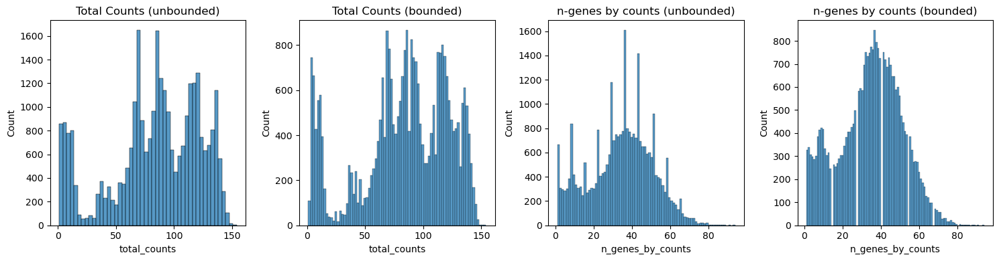

In [39]:
from banksy_utils.plot_utils import plot_qc_hist, plot_cell_positions

# bin options for fomratting histograms
# Here, we set 'auto' for 1st figure, 80 bins for 2nd figure. and so on
hist_bin_options = ['auto', 80, 80, 100]

plot_qc_hist(adata, 
         total_counts_cutoff = 300, # for visualization
         n_genes_high_cutoff = 1000, # for visualization
         n_genes_low_cutoff = 0, # for visualization
         bin_options = hist_bin_options)

## Filter 1 - minimum number of transcripts filter

### Plot knee plot (log10 transcripts per cell)

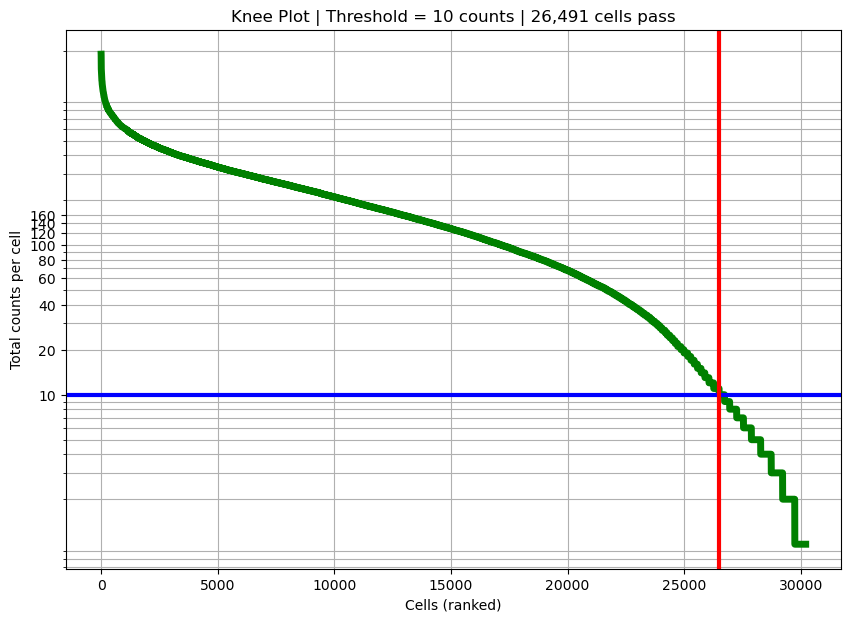

Cells passing threshold of 10 counts: 26,491 / 30,203 (87.7%)


In [40]:
## from https://pachterlab.github.io/kallistobustools/tutorials/kb_getting_started/python/kb_intro_2_python/

threshold = 10
#knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
knee = np.sort(adata.obs['nCount_Xenium'].values)[::-1]
#knee = np.sort(np.asarray(adata.X.sum(axis=1)).flatten())[::-1]

cell_set = np.arange(len(knee))
#num_cells = cell_set[knee > threshold] [::-1][0]
num_cells = (knee > threshold).sum()

fig, ax = plt.subplots(figsize=(10, 7))

#ax.loglog(cell_set, knee, linewidth=5, color="g")
ax.semilogy(knee, linewidth =5, color="g")
#ax.loglog(cell_set, knee, linewidth=5, color="g")
ax.axhline(y=threshold, linewidth=3, color="b")
ax.axvline(x=num_cells, linewidth=3, color="r")

ax.set_xlabel("Cells (ranked)")
ax.set_ylabel("Total counts per cell")

ax.set_yticks([10, 20, 40, 60, 80, 100, 120, 140, 160])
ax.yaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

plt.grid(True, which="both")
plt.title(f"Knee Plot | Threshold = {threshold} counts | {num_cells:,} cells pass")
plt.savefig(os.path.join(qc_path, f"transcript_knee_plot_{dataset_name}.png"), dpi =300, bbox_inches='tight')
plt.show()

print(f"Cells passing threshold of {threshold} counts: {num_cells:,} / {len(knee):,} ({num_cells/len(knee)*100:.1f}%)")

#### Apply the minimum transcripts per cell mask 

In [41]:
## Apply a mask to retrieve cells that don't pass the filter
mask = adata.obs['nCount_Xenium'] <= threshold

# Turn the masked cells into a data frame
mask.to_frame()
mask_cells = mask.reset_index()
mask_cells = mask_cells.rename(columns={"index":"cell_id", "nCount_Xenium" : "threshold_passed"})

# Filter for the poor cells and keep these ids for future plotting
poor_cells = mask_cells[mask_cells['threshold_passed']]

# Put results for the cells passing the threshold into the object directly
adata.obs['threshold_passed'] = adata.obs['nCount_Xenium'] > threshold #True = passed

#### Plot location of poor cells on tissue

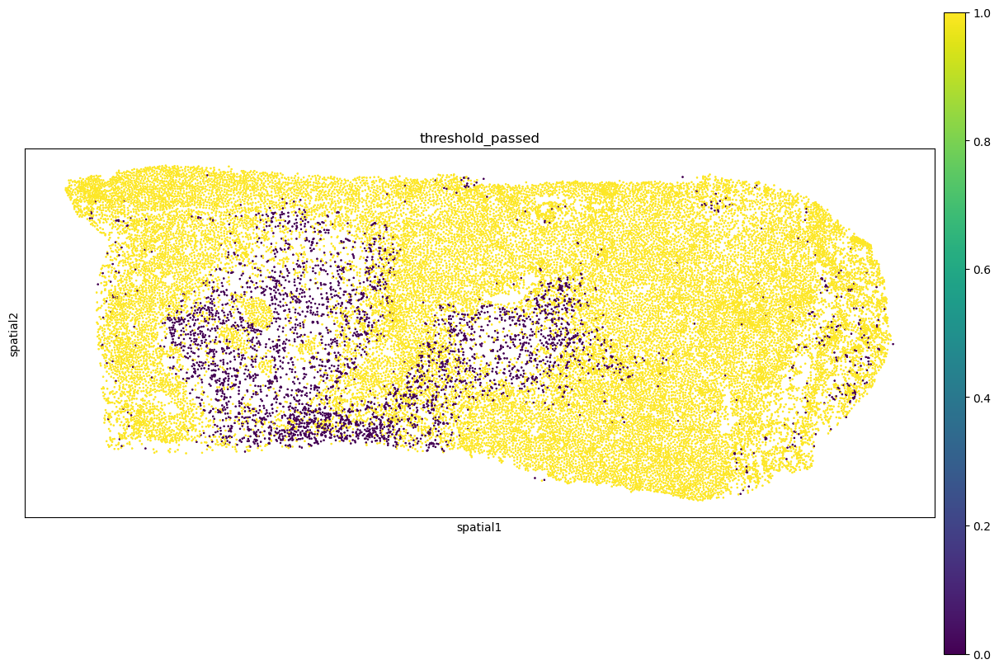

In [31]:
import squidpy as sq
with rc_context({"figure.figsize": (12,8)}):
    sq.pl.spatial_scatter(
        adata,
        library_id="spatial",
        color="threshold_passed",
        shape=None,
        size=2,
        img=False
    )


plt.savefig(
    os.path.join(qc_path, f"tissue_spatial_scatter_threshold_passed_cells_qc_{dataset_name}.png"),
    dpi=300,
    bbox_inches='tight'
    )


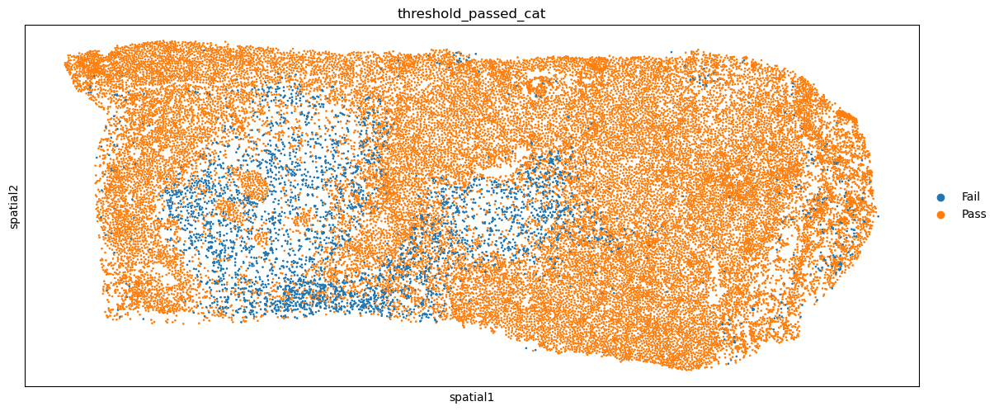

In [42]:
adata.obs["threshold_passed_cat"] = adata.obs["threshold_passed"].map({True: "Pass", False: "Fail"}).astype("category")

with rc_context({"figure.figsize": (12, 8)}):
    sq.pl.spatial_scatter(
        adata,
        library_id="spatial",
        color="threshold_passed_cat",
        shape=None,
        size=2,
        img=False
    )

## Read in pre-labelled object

In [6]:
file_path =f"{output_path}/{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad"

print("Exists?", os.path.exists(file_path))

Exists? True


In [45]:
## Read in the processed AnnData file
adata = ad.read_h5ad(f"{output_path}/{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad")
adata.obs_keys()


## Read in the banksy_dict dictionary as a .pkl file
## Use gzip to save it with compression
import gzip
import pickle
with gzip.open(f"{output_path}/{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_banksy_dict.pkl.gz", "rb") as f:
    banksy_dict = pickle.load(f)


## Read in the results_df data frame as a .pkl file
with gzip.open(f"{output_path}/results_df_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.pkl.gz", "rb") as f:
    results_df = pickle.load(f)


In [46]:
print(adata.layers.keys())

KeysView(Layers with keys: )


##

In [49]:
# Identify the largest label number and set that to max_num_labels

## extract the seperate spatial and non-spatial results
nonspatial_results = results_df[results_df["decay"] == "nonspatial"]
spatial_results = results_df[results_df["decay"] == "scaled_gaussian"]

nonspatial_labels = nonspatial_results["num_labels"].max()
spatial_labels = spatial_results["num_labels"].max()

def determine_max_num_labels(nonspatial_labels, spatial_labels):
## extract the number of labels 

    if nonspatial_labels > spatial_labels:
        max_num_labels = nonspatial_labels
        print(f"The number of nonspatial labels {nonspatial_labels} is greater than spatial labels {spatial_labels}, so {nonspatial_labels} is assigned to max_num_labels which {max_num_labels}.")

    if nonspatial_labels < spatial_labels:
        max_num_labels = spatial_labels
        print(f"The number of spatial labels {nonspatial_labels} is greater than nonspatial labels {spatial_labels}, so {spatial_labels} is assigned to max_num_labels which {max_num_labels}.")

    elif nonspatial_labels == spatial_labels:
        print(f"nonspatial and spatial decay have generated the same number of clusters, so {nonspatial_labels} is assigned to max_num_labels which is {max_num_labels}.")

    return(max_num_labels)


max_num_labels=determine_max_num_labels(nonspatial_labels, spatial_labels)

The number of nonspatial labels 11 is greater than spatial labels 10, so 11 is assigned to max_num_labels which 11.


In [ ]:
from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict[f"{nbr_weight_decay}"]['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = False,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    #save_path = os.path.join(file_path, 'tmp_png'),
    save_fig = True, # save the spatial map of all clusters
    save_seperate_fig = True, # save the figure of all clusters plotted seperately
    dataset_name = f"{dataset_name}",
    save_fullfig=True,
    save_path = output_path
)

Saving figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_nonspatial_pc35_nc0.00_r0.50_spatialmap.png
number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((11, 30203) x (30203, 30203) x (30203, 11))

Saving full-figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_nonspatial_pc35_nc0.00_r0.50_full_figure.png
Saving figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_scaled_gaussian_pc35_nc0.20_r0.50_spatialmap.png
number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((1

In [ ]:
spatial_labels

14

In [ ]:
## Generate place holder labels for clusters
from banksy_utils.cluster_utils import pad_clusters, create_spatial_nonspatial_adata,  refine_cell_types

## Spatial cluster place holders
cluster2annotation_spatial = {}

for i in range(spatial_labels):
    cluster2annotation_spatial[str(i)] = str(i)
print(cluster2annotation_spatial)

## Non-spatial cluster place holders
cluster2annotation_nonspatial = {}

for i in range(nonspatial_labels):
    cluster2annotation_nonspatial[str(i)] = str(i)
print(cluster2annotation_nonspatial)

pad_clusters(cluster2annotation_spatial, list(range(max_num_labels)))

{'0': '0', '1': '1', '2': '2', '3': '3', '4': '4', '5': '5', '6': '6', '7': '7', '8': '8', '9': '9', '10': '10', '11': '11', '12': '12', '13': '13'}
{'0': '0', '1': '1', '2': '2', '3': '3', '4': '4', '5': '5', '6': '6', '7': '7', '8': '8', '9': '9', '10': '10', '11': '11', '12': '12', '13': '13', '14': '14', '15': '15', '16': '16', '17': '17', '18': '18', '19': '19', '20': '20', '21': '21'}


In [ ]:
## Save annotations in two different anndata objects (adata_spatial and adata_nonspatial)

adata_spatial, adata_nonspatial = create_spatial_nonspatial_adata(results_df,
                                    pca_dims,
                                    lambda_list, 
                                    resolutions,
                                    cluster2annotation_spatial,
                                    cluster2annotation_nonspatial)

Using spatial params: scaled_gaussian_pc30_nc0.20_r0.50
nonspatial_pc30_nc0.00_r0.50


In [ ]:
## Store the cluster labels as a string in .obs
banksy_dict[f"{nbr_weight_decay}"][0.2]['adata'] #lambda = 0.20
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"]= adata_spatial.obs[f"labels_scaled_gaussian_pc{pca_label}_nc{lambda_label}_r{res_label}"].astype(str)

# Top expressed genes per cluster

### Spatial clustering results

In [156]:
import scanpy as sc

## Rank genes and identify cluster gene markers
sc.tl.rank_genes_groups(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
    method='wilcoxon',
    key_added=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers"
)


In [157]:
## Check which cluster keys exist
adata_spatial.uns[f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers']['names'].dtype

dtype((numpy.record, [('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', 'O'), ('6', 'O'), ('7', 'O'), ('8', 'O'), ('9', 'O'), ('10', 'O'), ('11', 'O'), ('12', 'O'), ('13', 'O')]))

In [158]:
## Using the filter_ranked_genes_by_type to create a key for 
from banksy_utils.annotation_utils import filter_ranked_genes_by_type

key_filtered = filter_ranked_genes_by_type(
    adata_spatial,
    key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers",
    top_n=100,
    gene_type = "raw",
    new_key_suffix="_raw",
)

Copied cluster labels to adata.obs['banksy_cluster_pc30_nc0.20_r0.50_raw']
Stored filtered raw markers in adata.uns['banksy_cluster_pc30_nc0.20_r0.50_markers_raw']


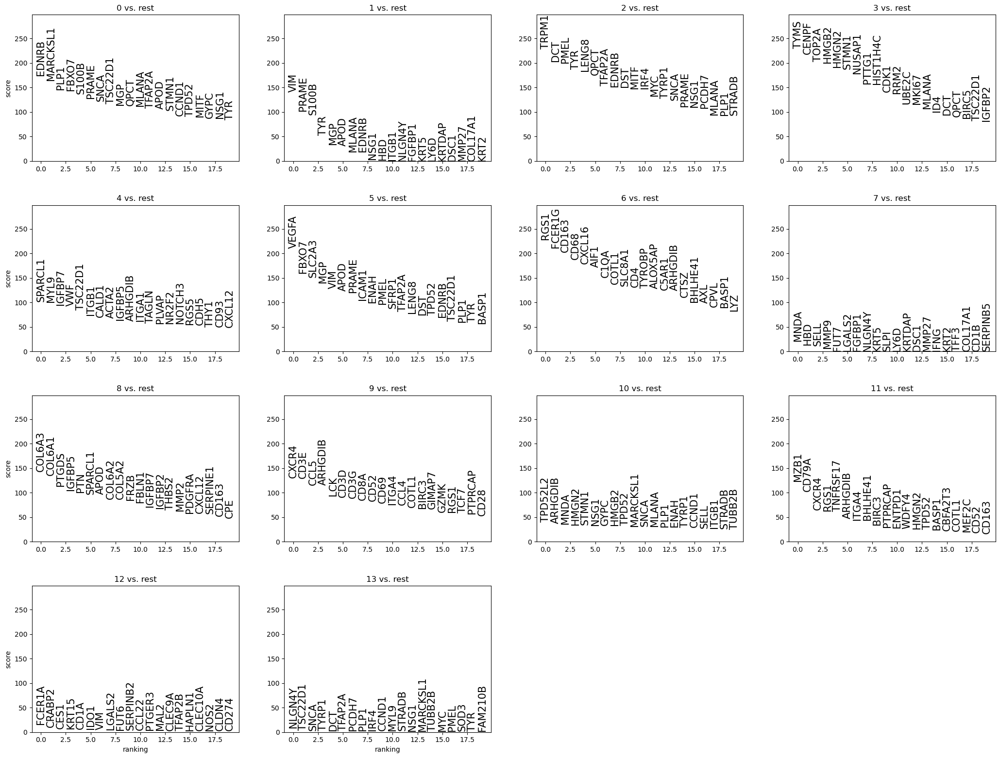

In [159]:
# Plot the gene markers for each cluster
sc.pl.rank_genes_groups(
    adata_spatial, 
    key=key_filtered,
    method='wilcoxon',
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_0", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_1", 
    #key_added = 'banksy_cluster_pc35_nc0.20_r0.50_markers_raw',
    #key_added= "raw_test",
    n_genes=20, 
    fontsize=15,
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_spatial_top_gene_raw.png")

In [160]:
# # Plot the gene markers for each cluster as a violin plot that conpares to every other cluster
# with rc_context({"figure.figsize": (9, 1.5)}):
#     sc.pl.rank_genes_groups_violin(
#         adata_spatial, 
#         n_genes=20, 
#         jitter=False, 
#         key = key_filtered
#         )

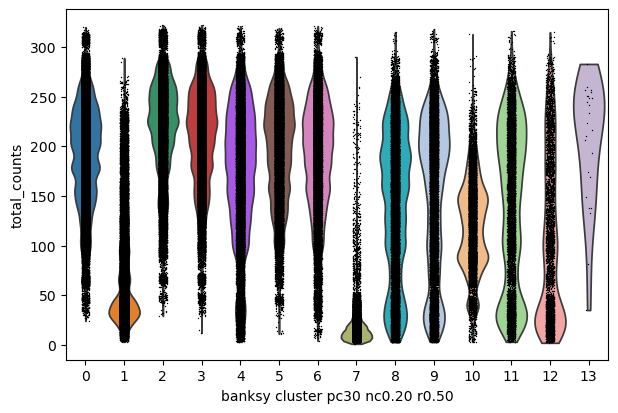

In [161]:
sc.pl.violin(
    adata_spatial, 
    "total_counts", 
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}", 
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
    )

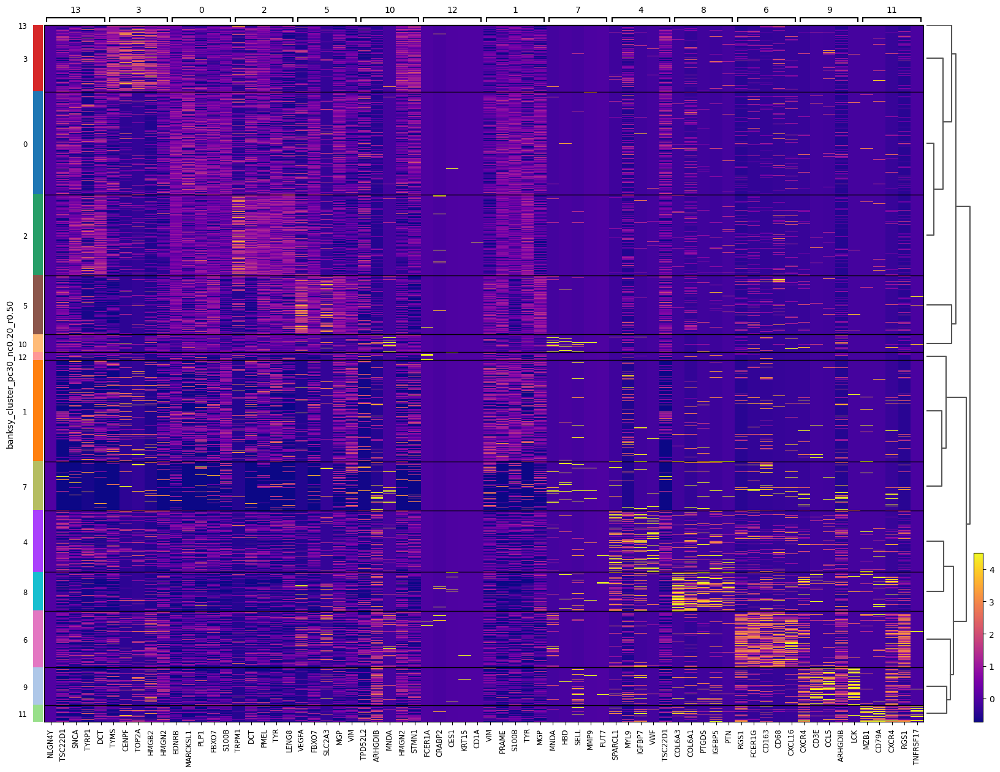

In [162]:
# Set the figure directory to your desired location
sc.settings.figdir = output_path

## Generate heat map for top markers per cluster
sc.tl.dendrogram(
    adata_spatial,
    groupby=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw',
    key_added=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw'
)

## Determine vmin and vmax dynamically based on gene expression
expr_values = adata_spatial.X
vmax_dynamic = np.percentile(expr_values[expr_values > 0], 99)
vmin_dynamic = np.percentile(expr_values, 1)

sc.pl.rank_genes_groups_heatmap(
    adata_spatial, 
    key=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw',
    #key= 'raw_test',
    n_genes=5,
    cmap = "plasma",
    vmin=vmin_dynamic,
    vmax=vmax_dynamic,
    show_gene_labels = True,
    save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_raw_markers.png",
    figsize=(20, 15)
)

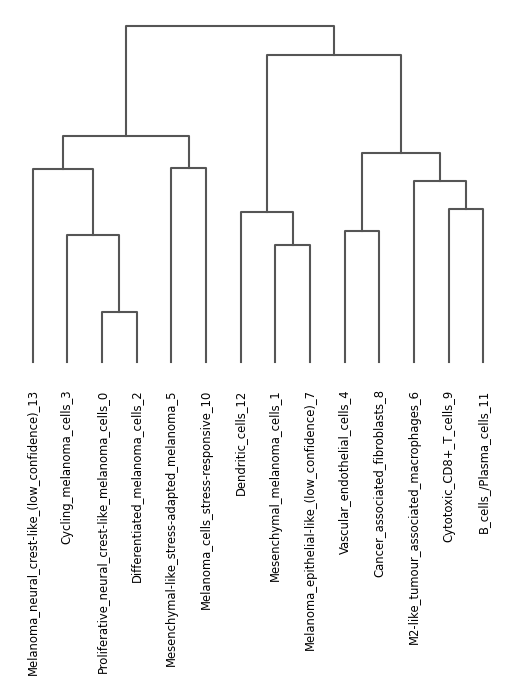

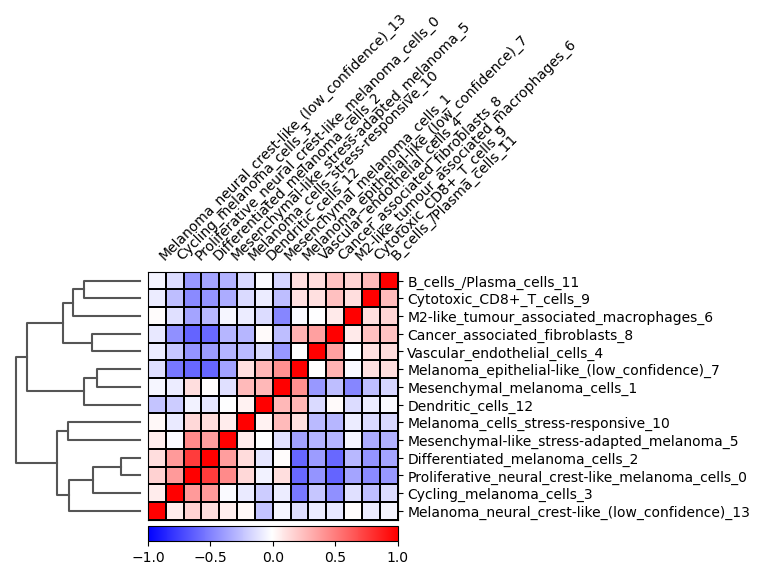

In [163]:
sc.pl.dendrogram(
    adata_spatial,
    groupby=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann',
    save=f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
)

sc.pl.correlation_matrix(
    adata_spatial,
    #groupby='banksy_cluster_pc35_nc0.20_r0.50_raw',
    f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_cluster_correlation_plot.png",
    figsize=(5, 3.5)
)

### Export the top 20 clusters in wide format to .csv

In [164]:
from banksy_utils.annotation_utils import export_clusters_wide

key= f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw"

export_clusters_wide(
    adata= adata_spatial,
    key= key,
    gene_type= "raw",
    top_n= 20,
    dataset_name= dataset_name,
    file_path= processed_path
)

           0        1       2         3        4        5        6         7         8        9        10        11        12        13
0      EDNRB      VIM   TRPM1      TYMS  SPARCL1    VEGFA     RGS1      MNDA    COL6A3    CXCR4   TPD52L2      MZB1    FCER1A    NLGN4Y
1   MARCKSL1    PRAME     DCT     CENPF     MYL9    FBXO7   FCER1G       HBD    COL6A1     CD3E   ARHGDIB     CD79A    CRABP2   TSC22D1
2       PLP1    S100B    PMEL     TOP2A   IGFBP7   SLC2A3    CD163      SELL     PTGDS     CCL5      MNDA     CXCR4      CES1      SNCA
3      FBXO7      TYR     TYR     HMGB2      VWF      MGP     CD68      MMP9    IGFBP5  ARHGDIB     HMGN2      RGS1     KRT15     TYRP1
4      S100B      MGP   LENG8     HMGN2  TSC22D1      VIM   CXCL16      FUT7       PTN      LCK     STMN1  TNFRSF17      CD1A       DCT
5      PRAME     APOD    QPCT     STMN1    ITGB1     APOD     AIF1    LGALS2   SPARCL1     CD3D      NSG1   ARHGDIB      IDO1    TFAP2A
6       SNCA    MLANA  TFAP2A    NUSAP1    CALD1

### Export the top 20 clusters in long format with scores to .csv

In [165]:
from banksy_utils.annotation_utils import export_cluster_markers

export_cluster_markers(
    adata = adata_spatial,
    key = key,
    top_n = 30,
    dataset_name = dataset_name,
    file_path = processed_path
)

,cluster,gene,score
0,0,EDNRB,174.014633
1,0,MARCKSL1,164.081192
2,0,PLP1,145.455750
3,0,FBXO7,143.715454
4,0,S100B,136.761993
...,...,...,...
289,13,PMEL,1.831699
290,13,SOD3,1.784539
291,13,TYR,1.778492
292,13,FAM210B,1.754752


### Add cell_type information to top clusters for manual annotation

In [166]:
## Read in the exported cluster markers generated with "export_clusters_wide()"
## and merge with the cell type annotation master document
n_genes_label =  20 # Set this to the number of genes that were exorted as top markers for each cluster
top_markers = pd.read_csv(f"{processed_path}/cluster_top_{n_genes_label}_genes_with_scores_{dataset_name}_{key}.csv", index_col=0) #index_col = 0 prevents insertion of an unnamed col
top_markers = top_markers.sort_index()
#print(top_markers)

## Read in the master annotation file which contains all the curated cell type labels for each marker gene
master_markers_file = pd.read_csv(f"{raw_path}/xenium_gene_list_annotation_master.csv")

## Create a data frame of the genes and their corresponding primary and secondary cell type annotations 
cell_annotations = master_markers_file[["Gene", "primary_annotation", "secondary_annotation"]]
#cell_annotations = cell_annotations.sort_index()

## Merge the top marker results and the cell type annotations
merged_markers = (
    pd.merge(
        top_markers.reset_index(), 
        cell_annotations, 
        left_on="gene", 
        right_on="Gene", 
        how="left", 
        sort="False",
        validate="m:1"
    )
    .set_index("index")
    .loc[top_markers.index]
)

merged_markers = merged_markers.drop("Gene", axis=1)
print(merged_markers)

## Export the cell type annotated top markers to .csv to use in manual annotation and ChatGPT annotation
merged_markers.to_csv(f"{processed_path}cell_type_cluster_top_{n_genes_label}_genes_{dataset_name}_{key}.csv")

     cluster      gene       score                    primary_annotation                         secondary_annotation
0          0     EDNRB  174.014633                              Melanoma        neural_crest_cell_derived_melanocytes
1          0  MARCKSL1  164.081192                   DC_CLEC9A_migrating                                          NaN
2          0      PLP1  145.455750                              Melanoma                              neuronal_myelin
3          0     FBXO7  143.715454                          Erythrocytes  cell cycle; cell proliferation (gene cards)
4          0     S100B  136.761993  DC_AXL_SIGLEC6; Macrophages and DC_2                                          NaN
..       ...       ...         ...                                   ...                                          ...
289       13      PMEL    1.831699                           Melanocytes                                          NaN
290       13      SOD3    1.784539       Secretory-papil

In [167]:
# # Save AnnData objects with cluster placeholder resultsn for downstream annotation

# adata_spatial.write_h5ad(
#     filename = f"{output_path}{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad",
#     compression="gzip"
#     )

# adata_nonspatial.write_h5ad(
#     filename = f"{output_path}{dataset_name}_clustered_nonspatial_pc{pca_label}_r{res_label}.h5ad"
#)

In [249]:
## The top 20 gene markers for each cluster are assessed for cell cluster annotation

new_labels = {
    '0' : 'Proliferative_neural_crest-like_melanoma_cells_0',
    '1' : 'Mesenchymal_melanoma_cells_1',
    '2' : 'Differentiated_melanoma_cells_2',
    '3' : 'Cycling_melanoma_cells_3',
    '4' : 'Vascular_endothelial_cells_4',
    '5' : 'Mesenchymal-like_stress-adapted_melanoma_5', 
    '6' : 'M2-like_tumour_associated_macrophages_6',
    '7' : 'Melanoma_epithelial-like_(low_confidence)_7',
    '8' : 'Cancer_associated_fibroblasts_8',
    '9' : 'Cytotoxic_CD8+_T_cells_9',
    '10' : 'Melanoma_cells_stress-responsive_10',
    '11' : 'B_cells_or_Plasma_cells_11',
    '12' : 'Dendritic_cells_12',
    '13' : 'Melanoma_neural_crest-like_(low_confidence)_13'
}

cluster_col = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"] = adata_spatial.obs[cluster_col].map(new_labels)

new_labels

{'0': 'Proliferative_neural_crest-like_melanoma_cells_0',
 '1': 'Mesenchymal_melanoma_cells_1',
 '2': 'Differentiated_melanoma_cells_2',
 '3': 'Cycling_melanoma_cells_3',
 '4': 'Vascular_endothelial_cells_4',
 '5': 'Mesenchymal-like_stress-adapted_melanoma_5',
 '6': 'M2-like_tumour_associated_macrophages_6',
 '7': 'Melanoma_epithelial-like_(low_confidence)_7',
 '8': 'Cancer_associated_fibroblasts_8',
 '9': 'Cytotoxic_CD8+_T_cells_9',
 '10': 'Melanoma_cells_stress-responsive_10',
 '11': 'B_cells_or_Plasma_cells_11',
 '12': 'Dendritic_cells_12',
 '13': 'Melanoma_neural_crest-like_(low_confidence)_13'}

In [250]:
## Store the UMAP results in the .obsm slot
adata_spatial.obsm['X_umap'] = banksy_dict['scaled_gaussian'][0.2]['adata'].obsm[f"reduced_pc_{pca_label}_umap"]

## Visualisations

### Cluster Annotated UMAP

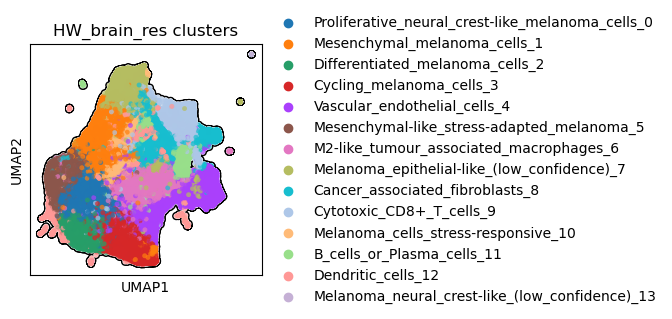

In [251]:
# Plot the umap with bulk labels
import scanpy as sc
from matplotlib.pyplot import rc_context

color_vars = [
f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
]

with rc_context({"figure.figsize": (3,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=50, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=10,
        title=f"{dataset_name} clusters",
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
        )

### Gene of interest UMAP and violin plotting

In [252]:
## Create a path for gene of interest UMAP plots
umap_path = os.path.join(base_dir,f"output/{dataset_name}/umap/")

if not os.path.isdir(umap_path):
    os.makedirs(umap_path)
    print(f"Directory '{umap_path}' created successfully.")
    
else:
    print(f"Directory '{umap_path}' already exists.")


## Create a path for gene of interest violin plots
violin_path = os.path.join(base_dir,f"output/{dataset_name}/violin/")

if not os.path.isdir(violin_path):
    os.makedirs(violin_path)
    print(f"Directory '{violin_path}' created successfully.")
    
else:
    print(f"Directory '{violin_path}' already exists.")

## Create a path for gene of interest violin plots
dotplot_path = os.path.join(base_dir,f"output/{dataset_name}/dotplot/")

if not os.path.isdir(dotplot_path):
    os.makedirs(dotplot_path)
    print(f"Directory '{dotplot_path}' created successfully.")
    
else:
    print(f"Directory '{dotplot_path}' already exists.")

## Create a path for gene of interest UMAP plots
neighbour_path = os.path.join(base_dir,f"output/{dataset_name}/neighbourhood_centrality_co-occurence/")

if not os.path.isdir(neighbour_path):
    os.makedirs(neighbour_path)
    print(f"Directory '{neighbour_path}' created successfully.")
    
else:
    print(f"Directory '{neighbour_path}' already exists.")


## Create a path for gene of interest spatial scatter plots
spatial_scatter_path = os.path.join(base_dir,f"output/{dataset_name}/spatial_scatter/")

if not os.path.isdir(spatial_scatter_path):
    os.makedirs(spatial_scatter_path)
    print(f"Directory '{spatial_scatter_path}' created successfully.")
    
else:
    print(f"Directory '{spatial_scatter_path}' already exists.")


Directory 'data/xenium/output/HW_brain_res/umap/' already exists.
Directory 'data/xenium/output/HW_brain_res/violin/' already exists.
Directory 'data/xenium/output/HW_brain_res/dotplot/' already exists.
Directory 'data/xenium/output/HW_brain_res/neighbourhood_centrality_co-occurence/' already exists.
Directory 'data/xenium/output/HW_brain_res/spatial_scatter/' already exists.


In [253]:
output_path

'data/xenium/output/HW_brain_res'

## UMAPs

In [254]:
# Set the figure directory to your desired location
sc.settings.figdir = umap_path

#### DSG2

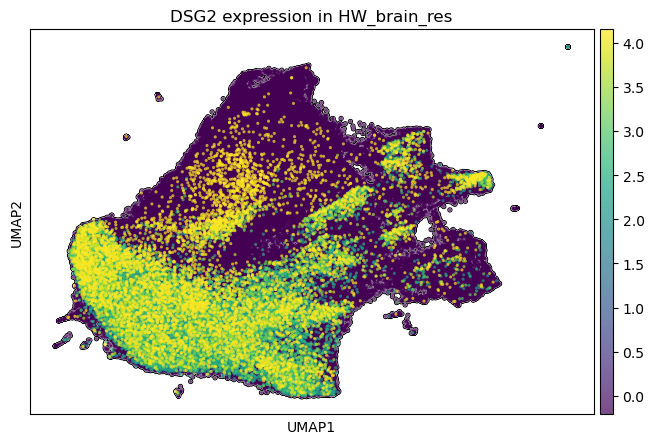

In [255]:
color_vars = [
"DSG2"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"DSG2 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_response_genes.png"
        )

### SERPINE1

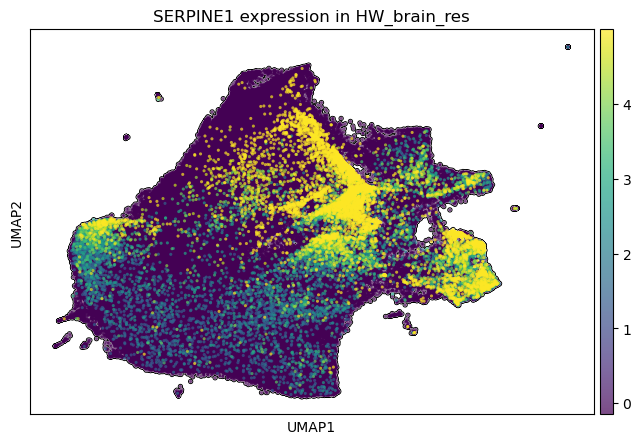

In [256]:
color_vars = [
"SERPINE1"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"SERPINE1 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_SERPINE1_response_genes.png"
        )

### DKK1

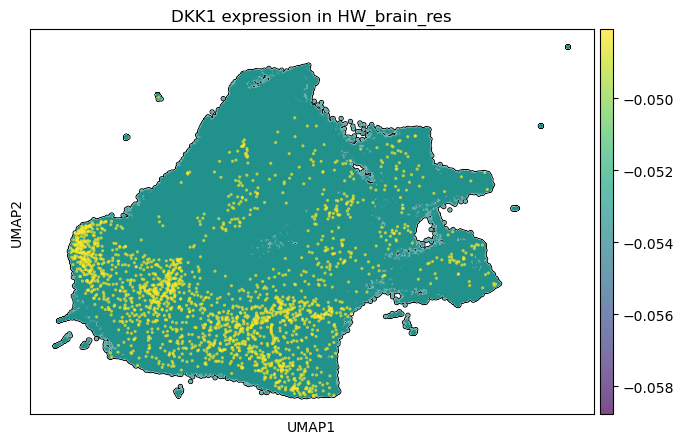

In [257]:
color_vars = [
"DKK1"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"DKK1 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DKK1_response_genes.png"
        )

### T cell markers

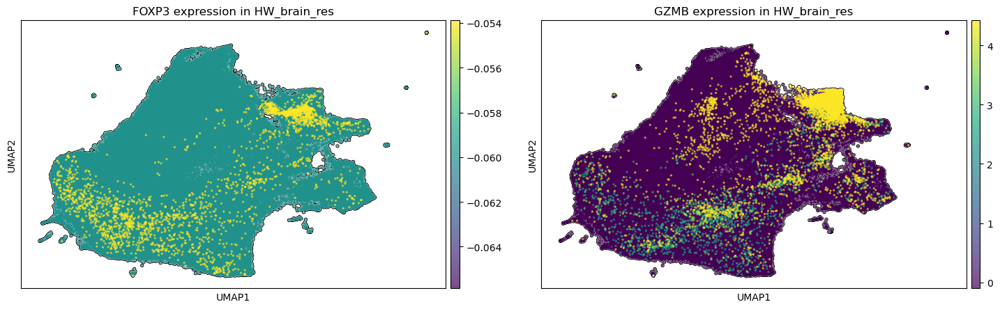

In [258]:
color_vars = [
"FOXP3", "GZMB"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"FOXP3 expression in {dataset_name}", f"GZMB expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_T_cell_markers_response_genes.png"
        )

### Integrin genes

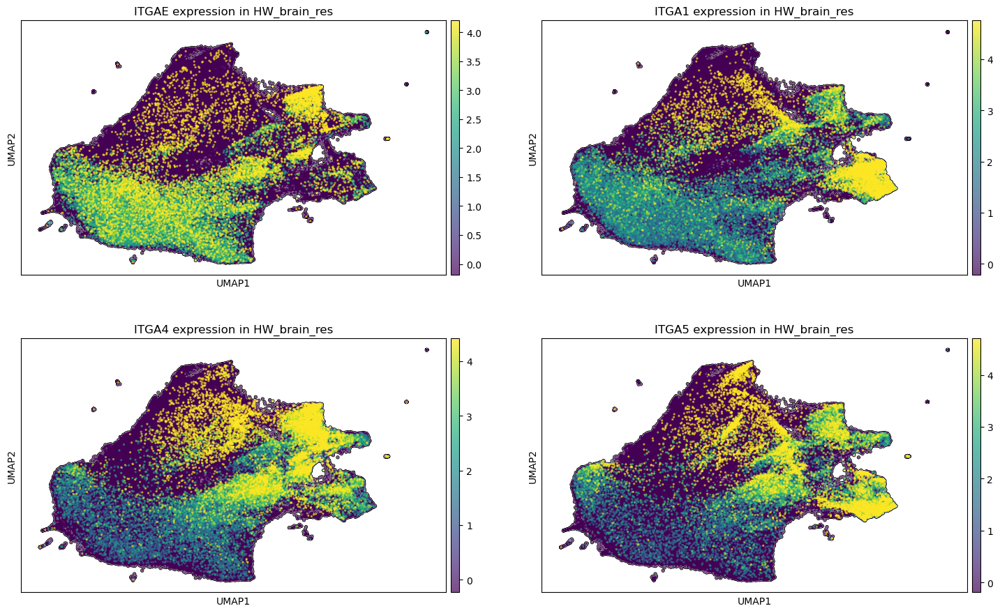

In [259]:
color_vars = [
"ITGAE", 
"ITGA1", 
"ITGA4",
"ITGA5"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        ncols=2,
        title=[
            f"ITGAE expression in {dataset_name}", 
            f"ITGA1 expression in {dataset_name}", 
            f"ITGA4 expression in {dataset_name}", 
            f"ITGA5 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_integrin_genes.png"
        )

### TPD52 family

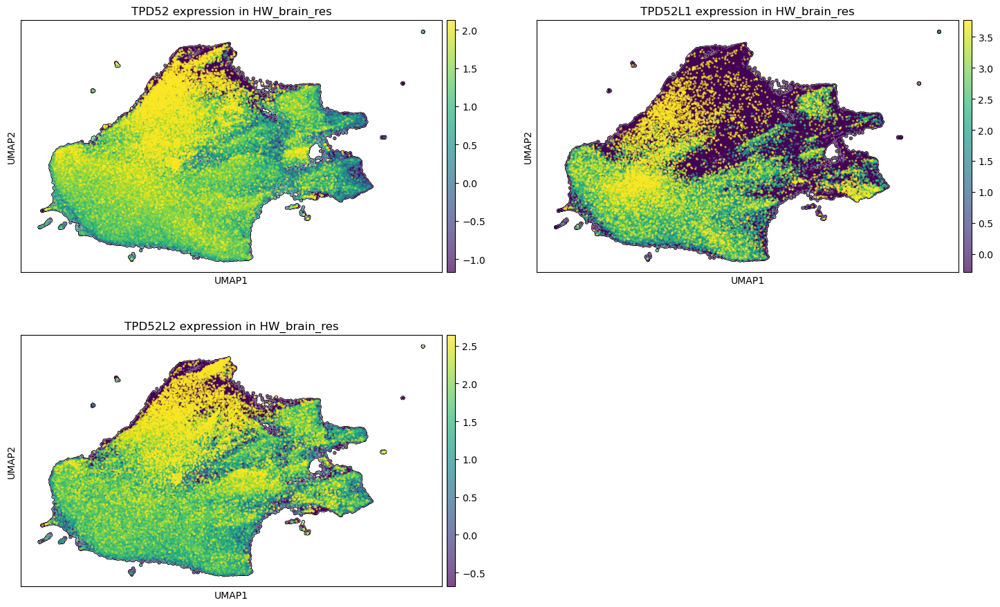

In [260]:
color_vars = [
"TPD52", "TPD52L1", "TPD52L2"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        ncols=2,
        title=[f"TPD52 expression in {dataset_name}", f"TPD52L1 expression in {dataset_name}", f"TPD52L2 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD52-like_genes.png"
        )

#### Selectins

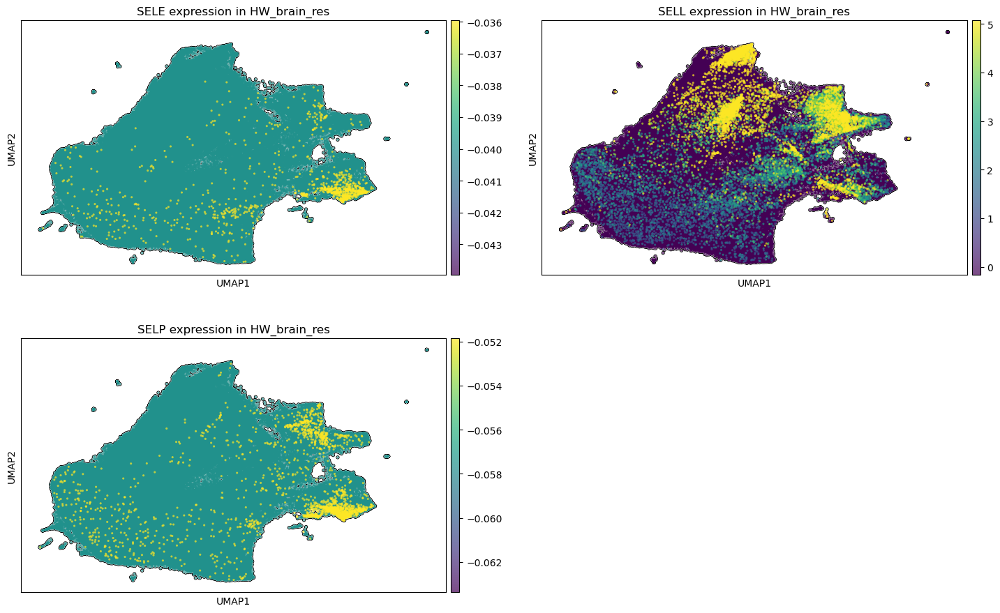

In [261]:
color_vars = [
"SELE", "SELL", "SELP"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        ncols=2,
        title=[f"SELE expression in {dataset_name}", f"SELL expression in {dataset_name}", f"SELP expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_selectins.png"
        )

### Fucosyltransferase genes

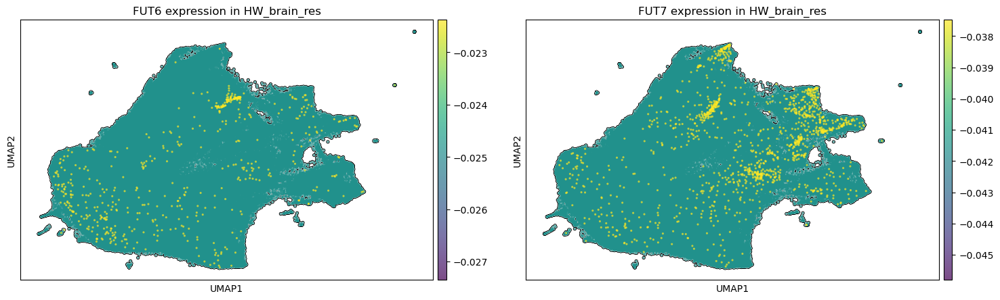

In [262]:
color_vars = [
"FUT6", "FUT7"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"FUT6 expression in {dataset_name}", f"FUT7 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_FUT6_FUT7.png"
        )

### Adhesion molecules

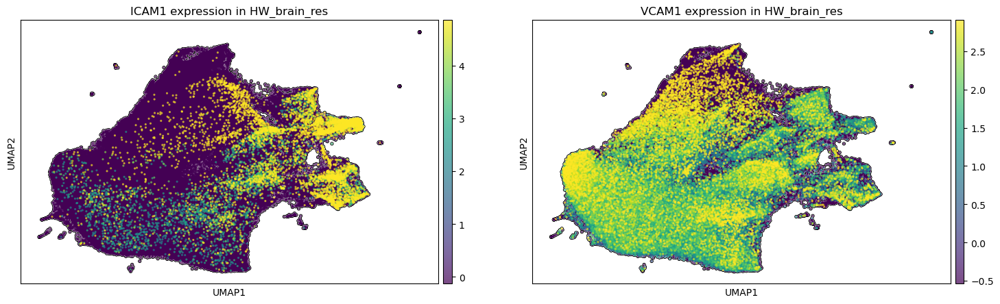

In [263]:
color_vars = [
"VCAM1", "ICAM1"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=[f"ICAM1 expression in {dataset_name}", f"VCAM1 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_adhesion_genes.png"
        )

### ICI response genes

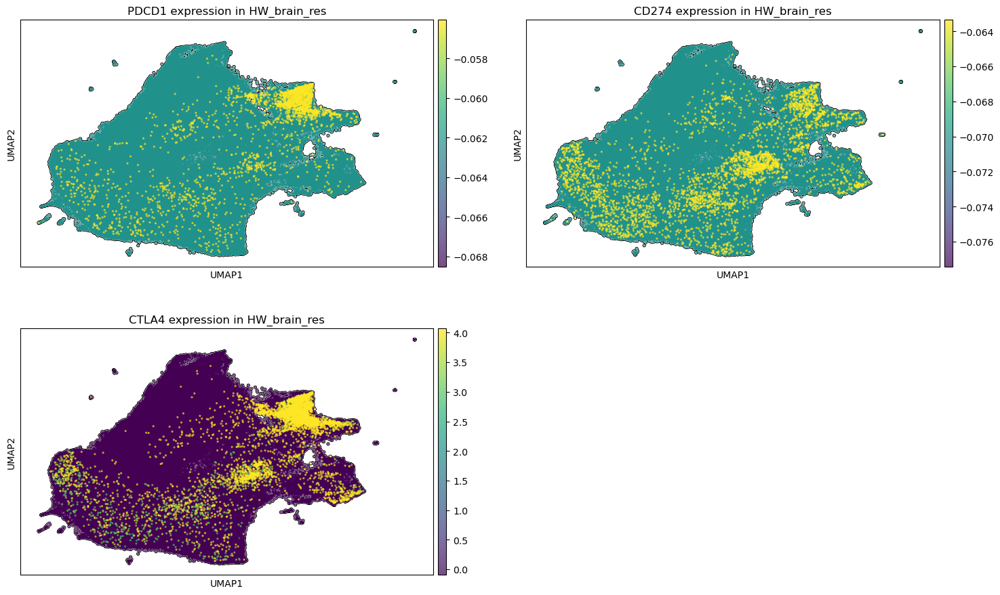

In [264]:
color_vars = [
"PDCD1", "CD274", "CTLA4"
]

with rc_context({"figure.figsize": (8,5)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        ncols=2,
        title=[f"PDCD1 expression in {dataset_name}", f"CD274 expression in {dataset_name}", f"CTLA4 expression in {dataset_name}"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_ICI_response_genes.png"
        )

## Gene expression violin plots

In [265]:
# Set the figure directory to your desired location
sc.settings.figdir = violin_path

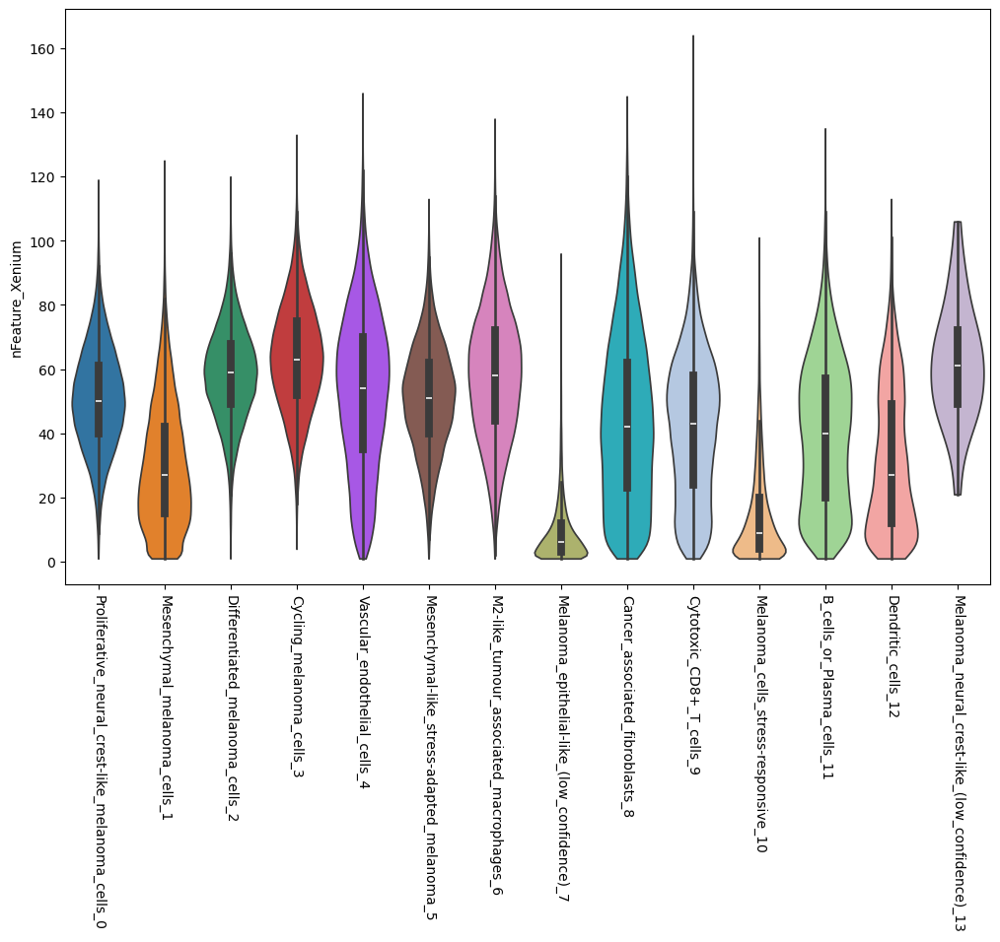

In [266]:
with rc_context({"figure.figsize": (10, 8)}):
    ax= sc.pl.violin(
        adata_spatial,
        ["nFeature_Xenium"],
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        stripplot=False,  # remove the internal dots
        inner="box",  # adds a boxplot inside violins
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_gene_count_per_cluster_violin_plot.png"
    )

### DSG2

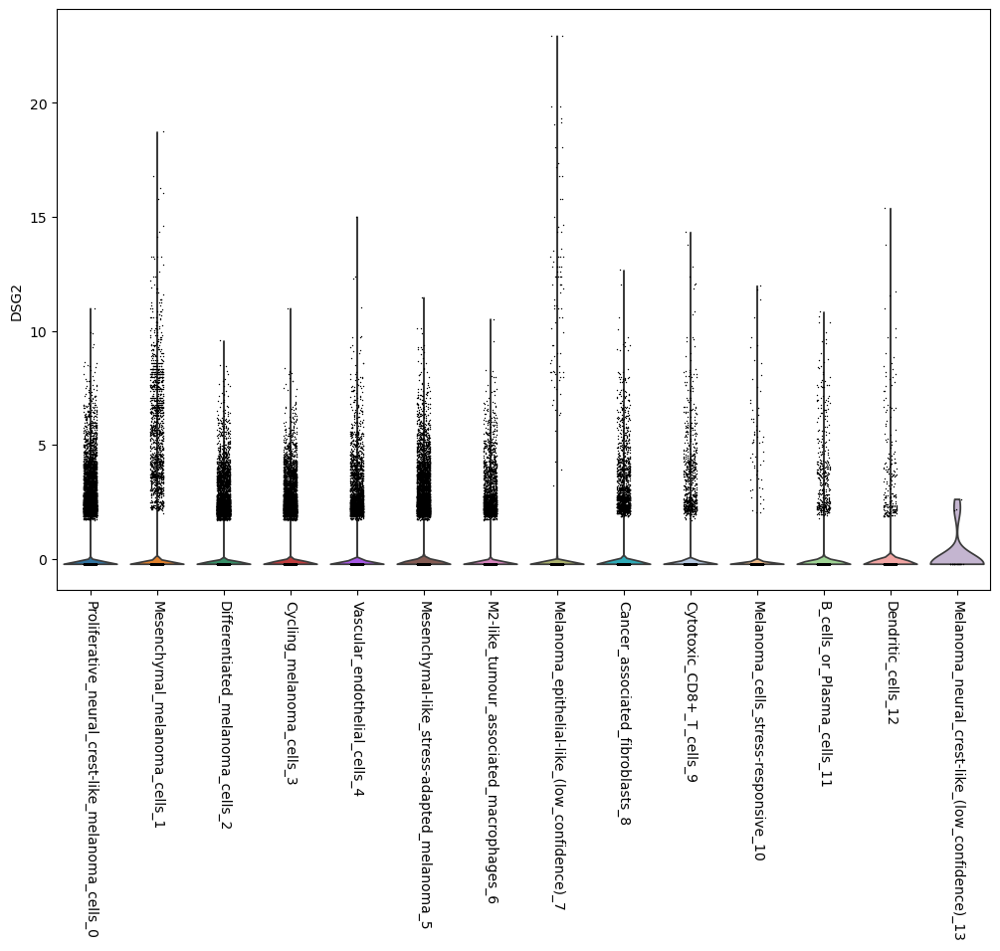

In [267]:
with rc_context({"figure.figsize": (10,8)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "DSG2"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_family_violin_plot.png"
        )

### SERPINE1

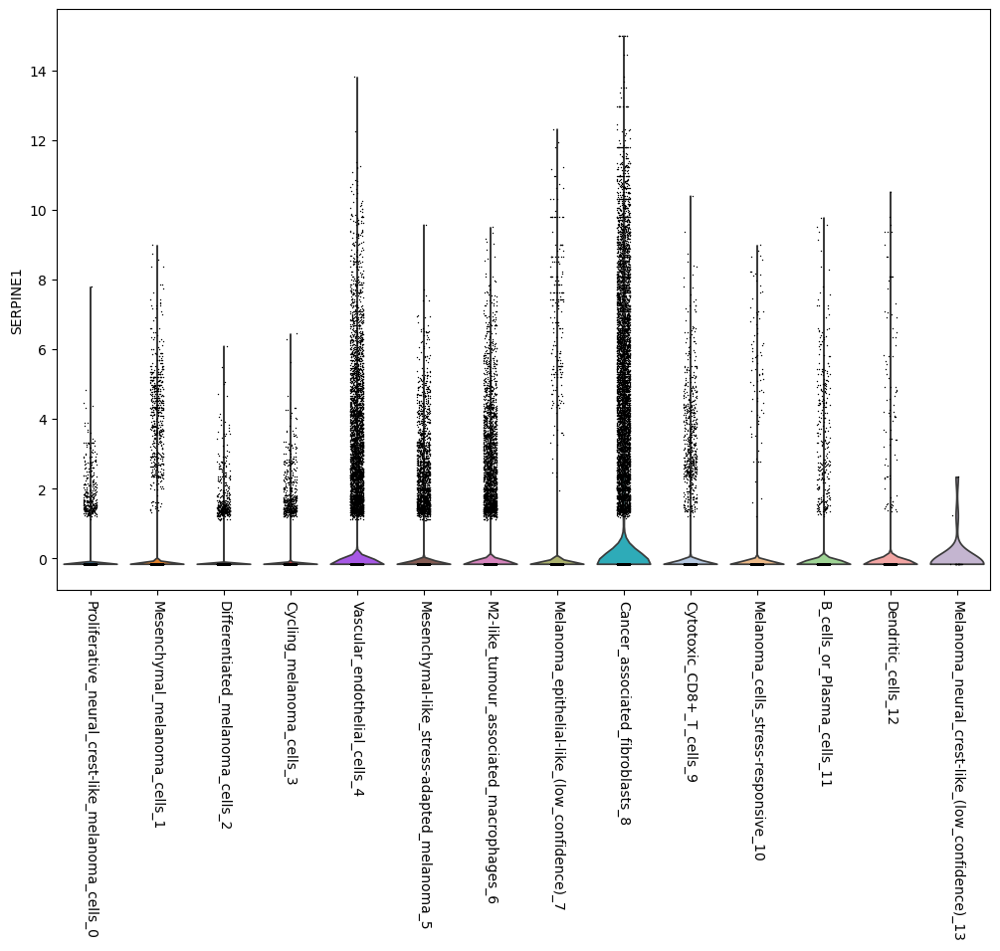

In [268]:
with rc_context({"figure.figsize": (10, 8)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "SERPINE1"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_SERPINE1_family_violin_plot.png"
        )

### DKK1

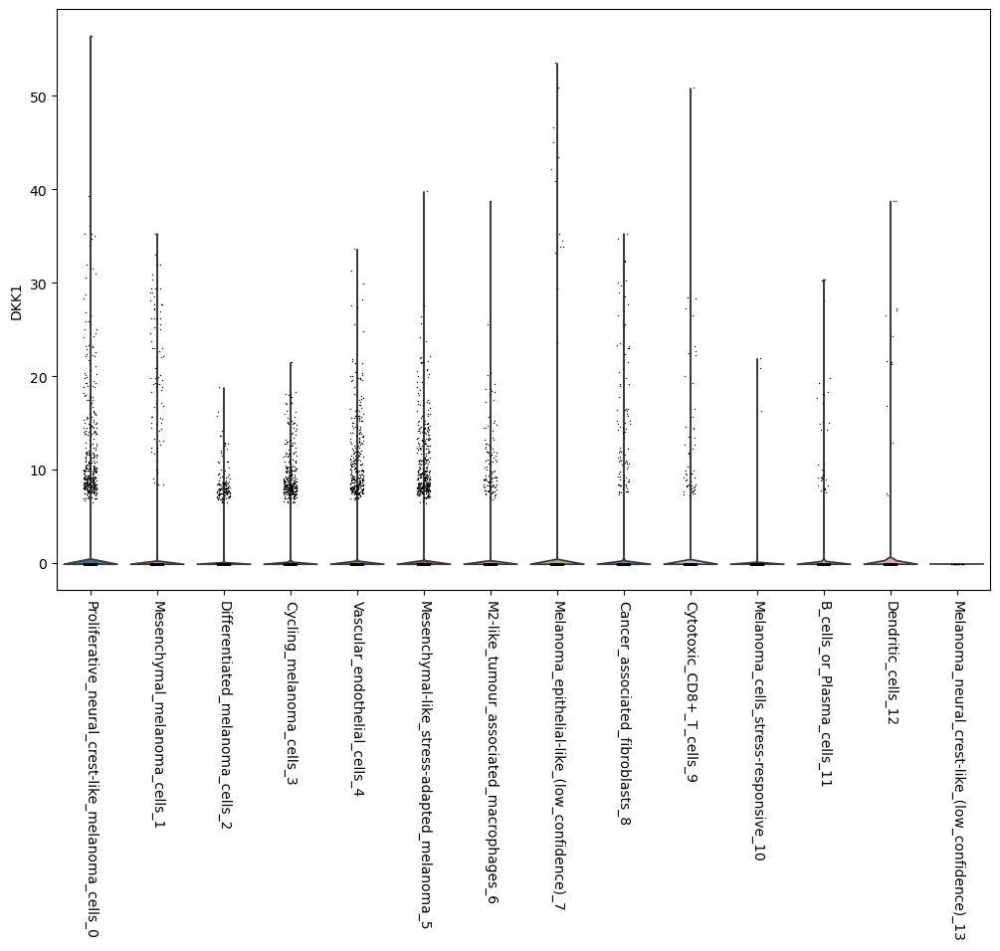

In [269]:
with rc_context({"figure.figsize": (10,8)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "DKK1"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DKK1_family_violin_plot.png"
        )

### T cell markers

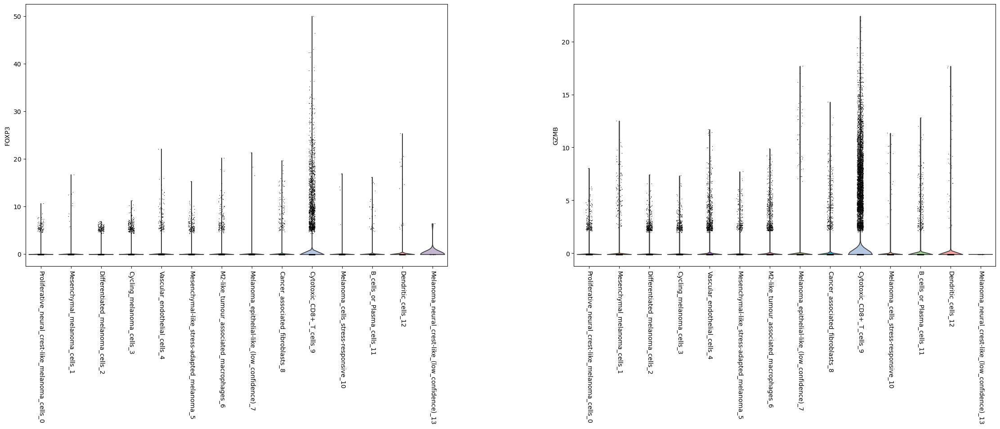

In [270]:
with rc_context({"figure.figsize": (10, 8)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "FOXP3", 
            "GZMB"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_T_cell_markers_violin_plot.png"
        )

### Integrins

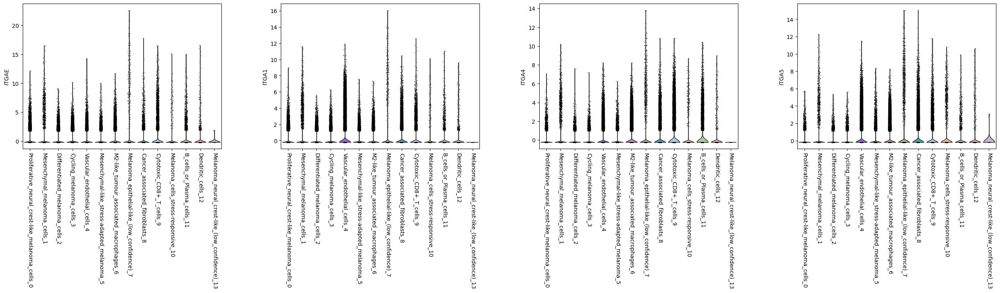

In [271]:
with rc_context({"figure.figsize": (6, 5)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "ITGAE", 
            "ITGA1", 
            "ITGA4",
            "ITGA5"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_integrin_genes_violin_plot.png"
        )

### TPD52 genes

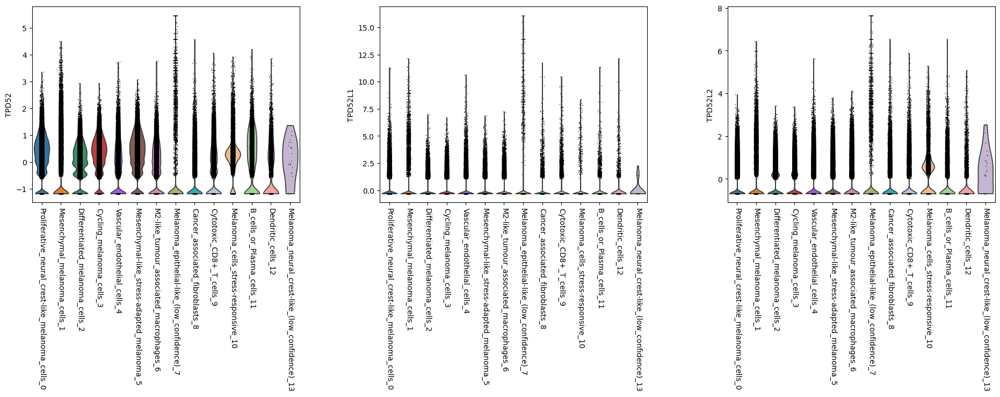

In [272]:
with rc_context({"figure.figsize": (6, 5)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "TPD52",
            "TPD52L1",
            "TPD52L2"
            ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD52_genes_violin_plot.png"
        )

#### Selectins

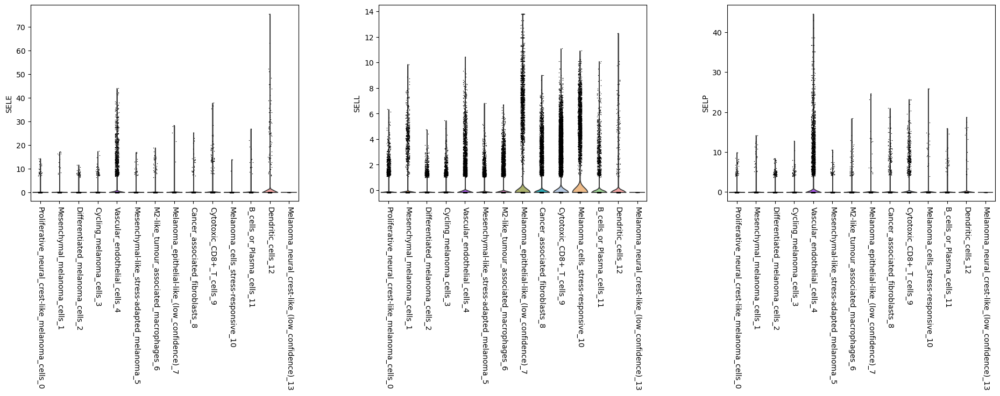

In [273]:
with rc_context({"figure.figsize": (6,5)}):
    sc.pl.violin(
        adata_spatial, 
        [
        "SELE", 
        "SELL", 
        "SELP"
        ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_selectin_genes_violin_plot.png"
        )

### Fucosyltransferase genes

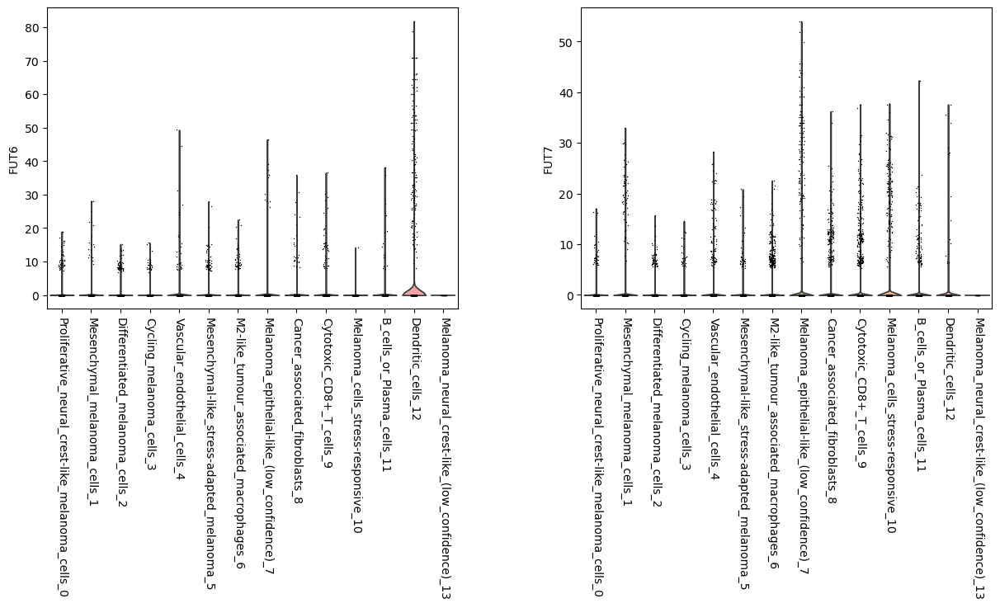

In [274]:
with rc_context({"figure.figsize": (6, 5)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "FUT6", 
            "FUT7"
        ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_fucosyltransferase_genes_violin_plot.png"
        )

### Adhesion genes

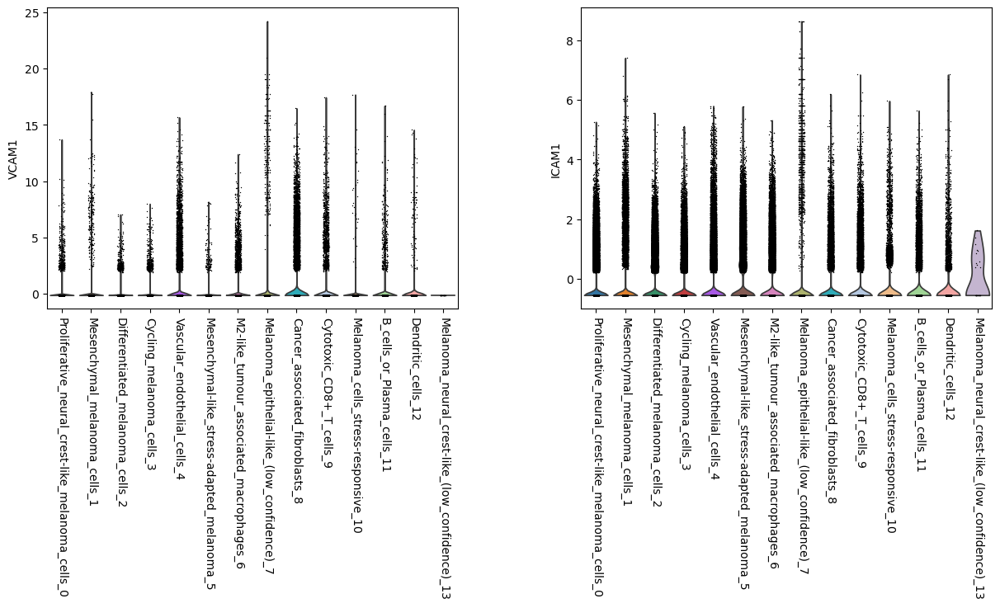

In [275]:
with rc_context({"figure.figsize": (6,5 )}):
    sc.pl.violin(
        adata_spatial, 
        [
            "VCAM1",
            "ICAM1"
        ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_adhesion_genes_violin_plot.png"
        )

### ICI response genes

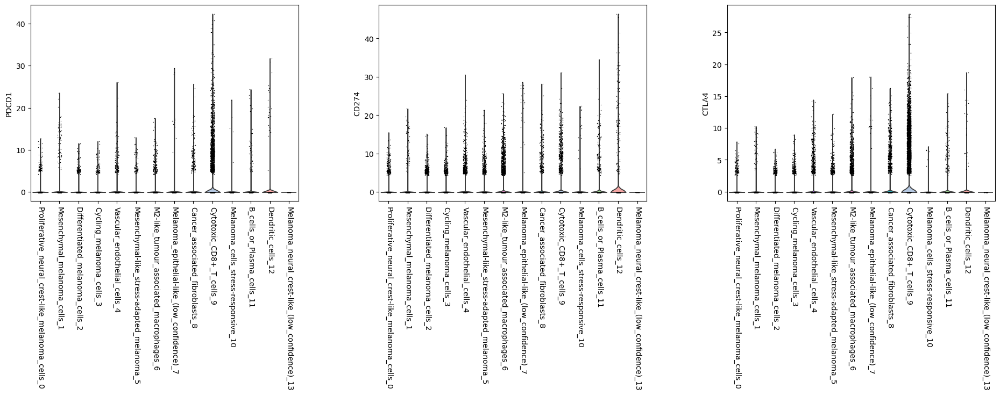

In [276]:
with rc_context({"figure.figsize": (6, 5)}):
    sc.pl.violin(
        adata_spatial, 
        [
            "PDCD1", 
            "CD274", 
            "CTLA4"
        ], 
        #groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
        rotation=270,
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_adhesion_genes_violin_plot.png"
        )

## Gene expression dot plots

In [277]:
# Set the figure directory to your desired location
sc.settings.figdir = dotplot_path

In [278]:
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"]

aaaaafff-1            Melanoma_cells_stress-responsive_10
aaaadpgp-1                   Mesenchymal_melanoma_cells_1
aaaaffjc-1                   Mesenchymal_melanoma_cells_1
aaaajbjg-1                   Mesenchymal_melanoma_cells_1
aaaammgl-1                   Mesenchymal_melanoma_cells_1
                                 ...                     
oinacenm-1    Melanoma_epithelial-like_(low_confidence)_7
oinaobkl-1    Melanoma_epithelial-like_(low_confidence)_7
oinbabol-1    Melanoma_epithelial-like_(low_confidence)_7
oinbddah-1                   Mesenchymal_melanoma_cells_1
oinbecce-1                   Mesenchymal_melanoma_cells_1
Name: banksy_cluster_pc30_nc0.20_r0.50_ann, Length: 435098, dtype: category
Categories (14, object): ['Proliferative_neural_crest-like_melanoma_cell..., 'Mesenchymal_melanoma_cells_1', 'Differentiated_melanoma_cells_2', 'Cycling_melanoma_cells_3', ..., 'Melanoma_cells_stress-responsive_10', 'B_cells_or_Plasma_cells_11',
                          'Dendritic_cel

In [279]:
# {'0': 'Differentiated_melanoma_cells_0',
#  '1': 'Invasive_melanoma_cells_1',
#  '2': 'Cytotoxic_CD8+_T_cells_2',
#  '3': 'Cancer_associated_fibroblasts_3',
#  '4': 'IFN-responsive_dedifferentiated_melanoma_cells_4',
#  '5': 'M2-like_tumour_associated_macrophages_5',
#  '6': 'Cycling_melanoma_cells_6',
#  '7': 'CD4+_naive_or_memory_T_cells_(TCF7+ SELL+)_7',
#  '8': 'Vascular_endothelial_cells_8',
#  '9': 'Plasma_B_cells_9',
#  '10': 'Tumor–Epidermal Interface Melanoma Cells_(low_confidence)_10',
#  '11': 'Invasive_melanoma_cells_(low_confidence)_11',
#  '12': 'Melanoma_cells_lymphatic_interface_(MITF+)_12',
#  '13': 'Proliferative–Invasive_melanoma_cells_(MITF+ VIM+)_13',
#  '14': 'Immune-Interacting_melanoma_cells_MITF+_(low_confidence)_14',
#  '15': 'Proliferative–Invasive_melanoma_cells_MITF+ VIM+ MYH11+_(low_confidence)_15',
#  '16': 'Interface_melanoma_cells_keratinocyte-immune-Interacting_(low_confidence)_16',
#  '17': 'Immune-Interacting_stromal_cells_(low_confidence)_17'}

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Proliferative_neural_crest-like_melanoma_cells_0


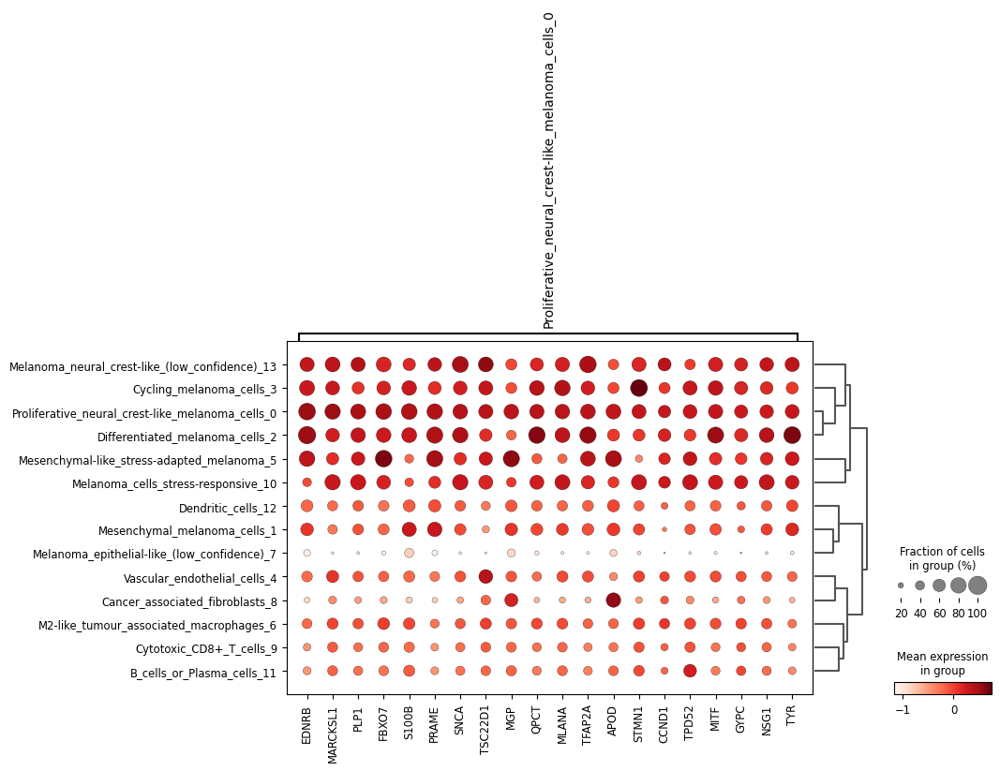

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Mesenchymal_melanoma_cells_1


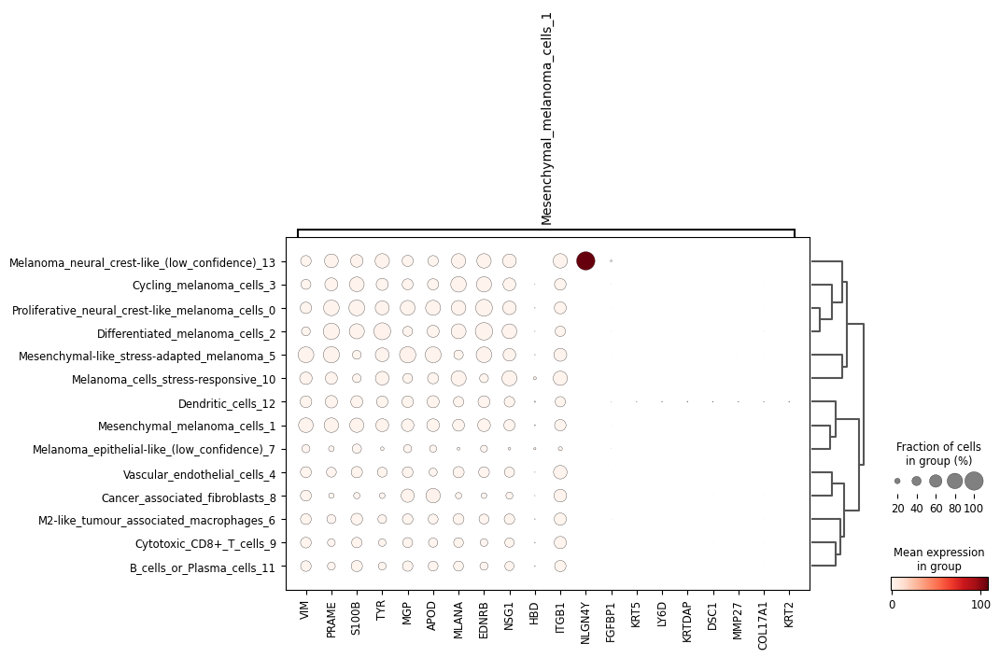

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Differentiated_melanoma_cells_2


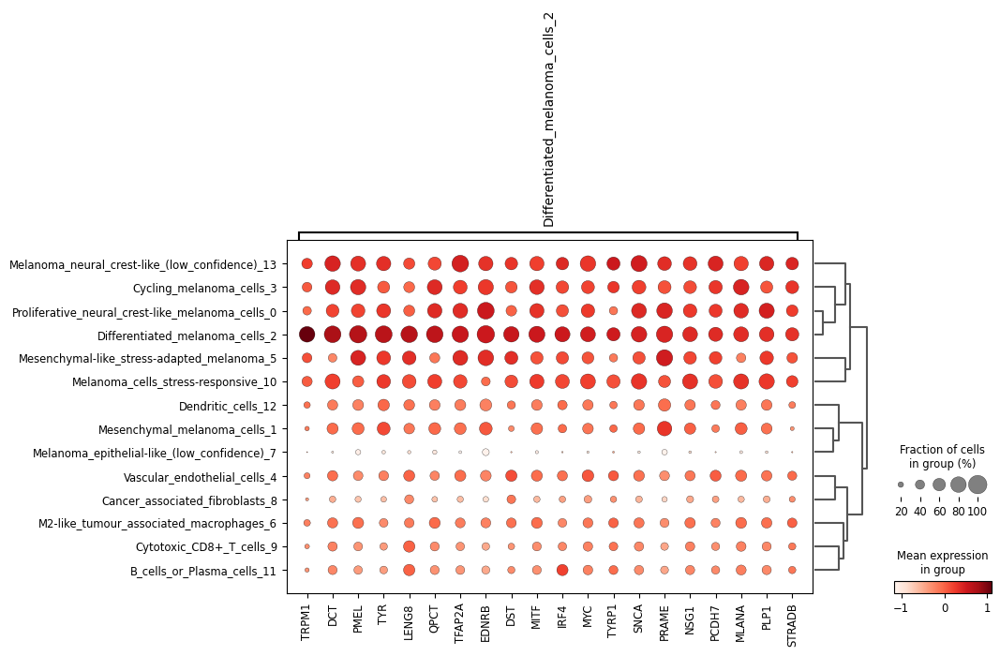

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Cycling_melanoma_cells_3


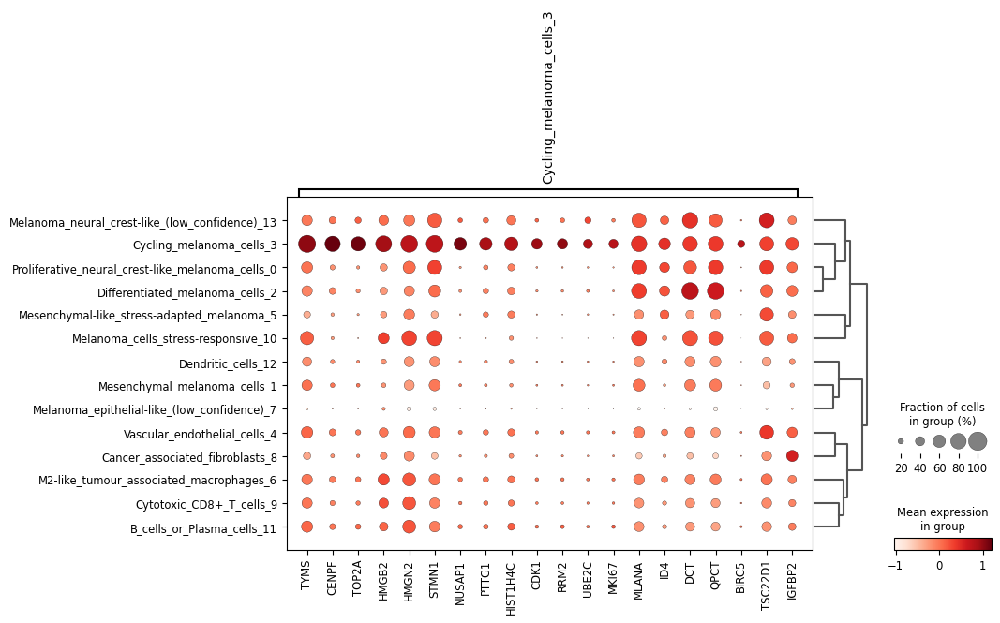

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Vascular_endothelial_cells_4


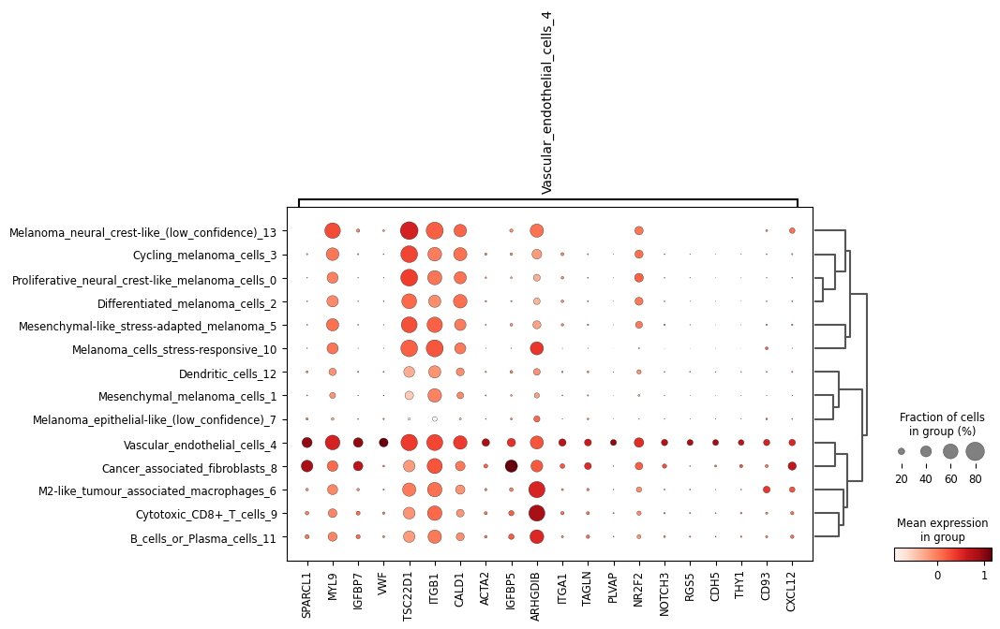

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Mesenchymal-like_stress-adapted_melanoma_5


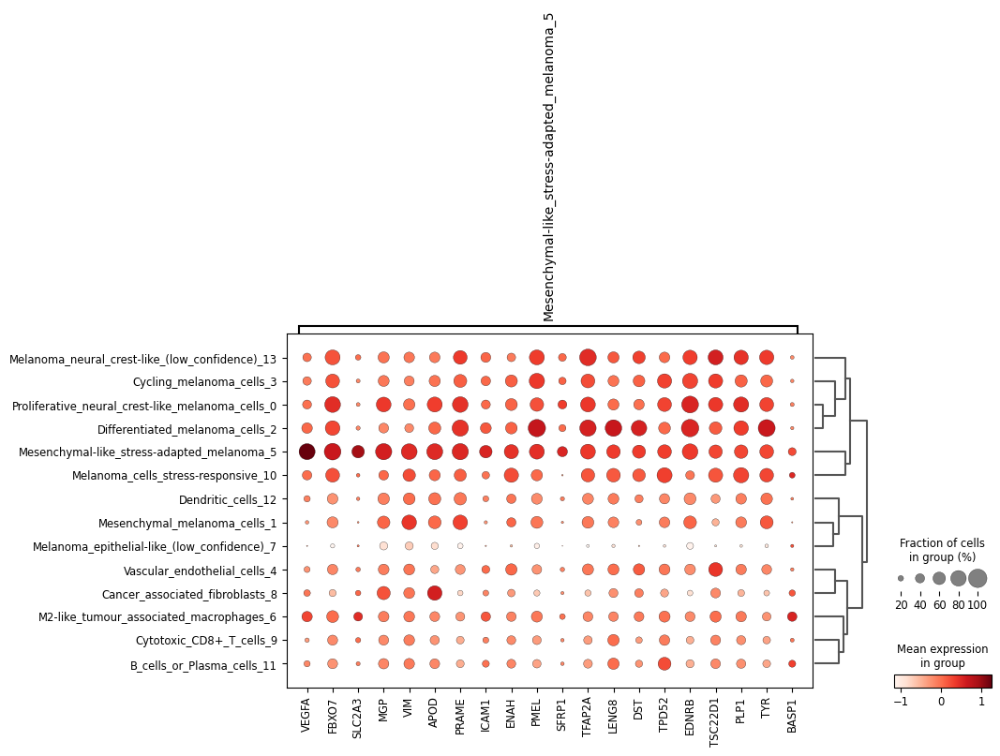

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: M2-like_tumour_associated_macrophages_6


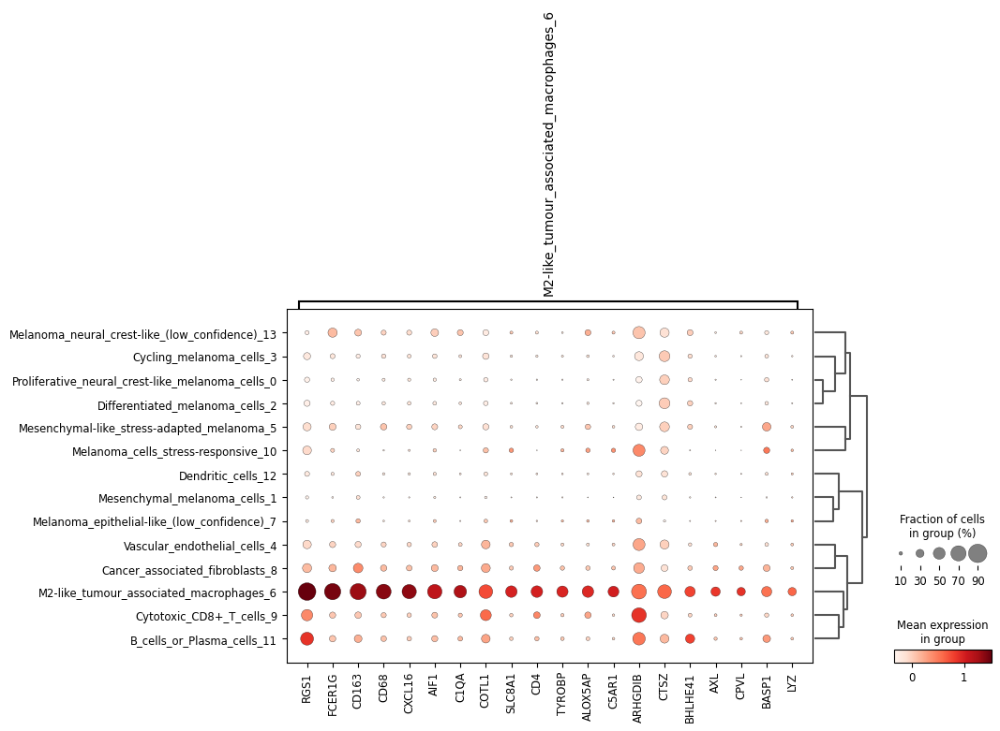

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Melanoma_epithelial-like_(low_confidence)_7


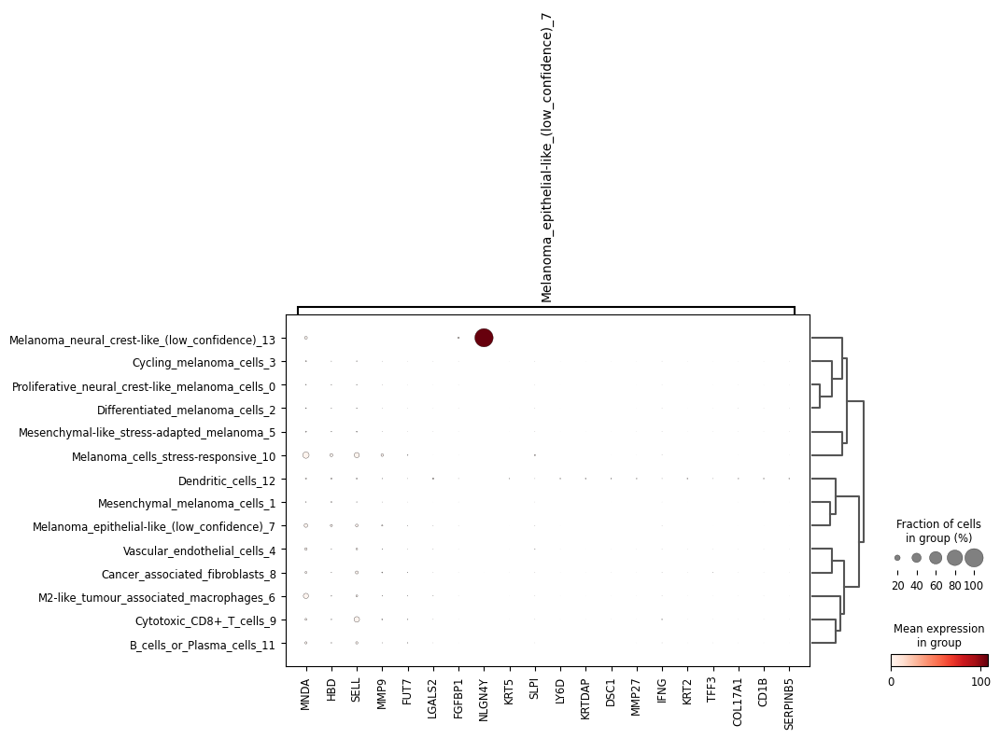

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Cancer_associated_fibroblasts_8


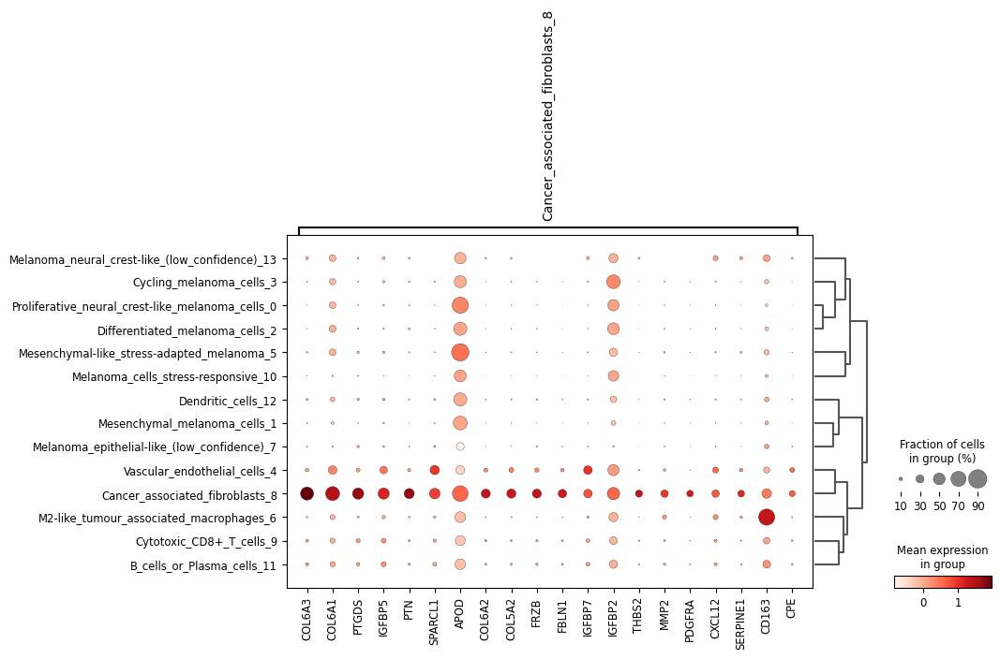

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Cytotoxic_CD8+_T_cells_9


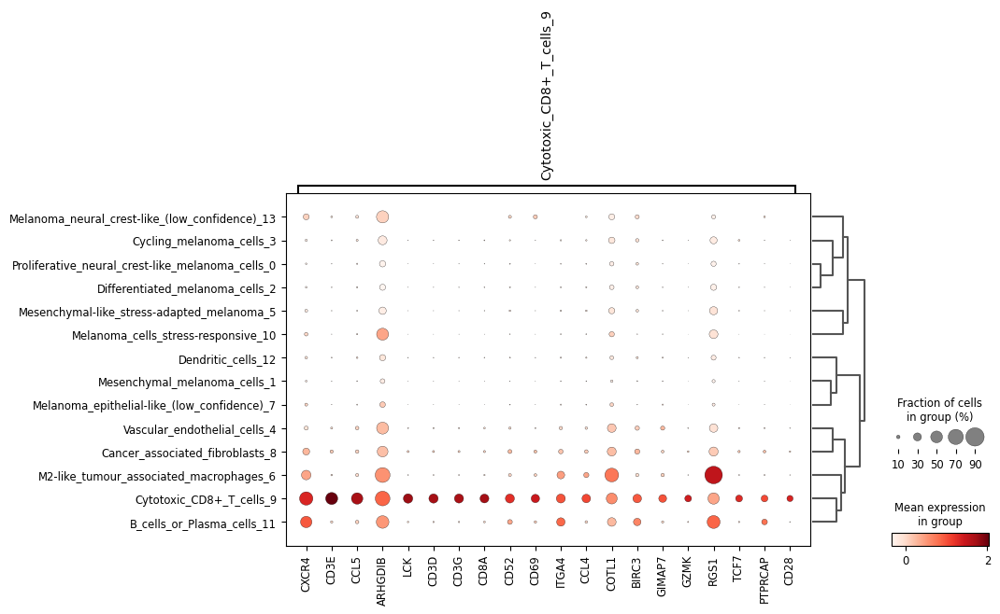

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Melanoma_cells_stress-responsive_10


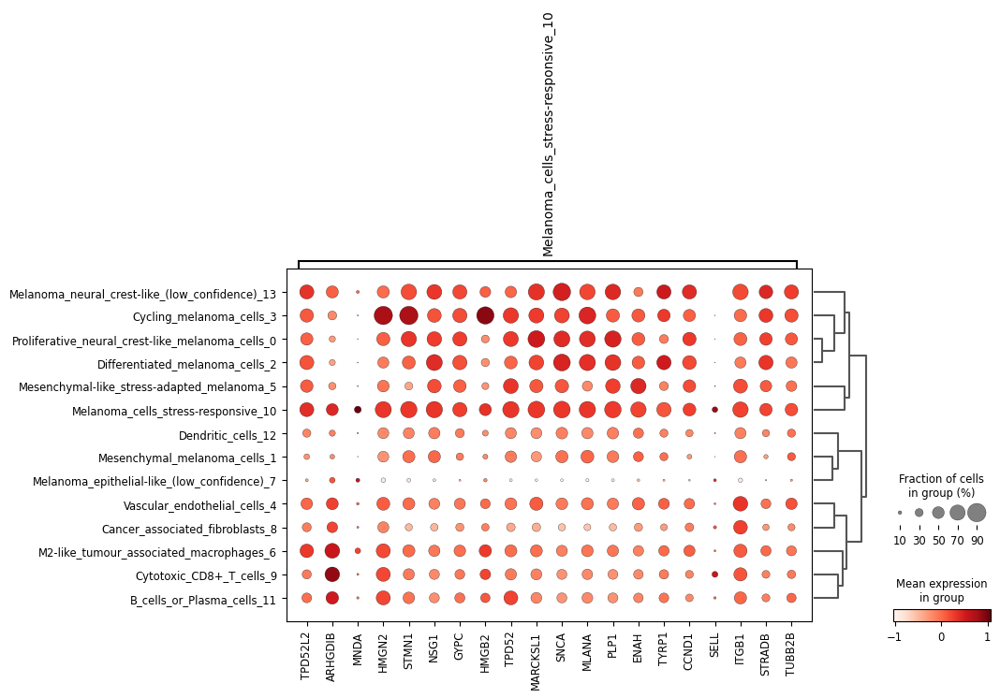

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: B_cells_or_Plasma_cells_11


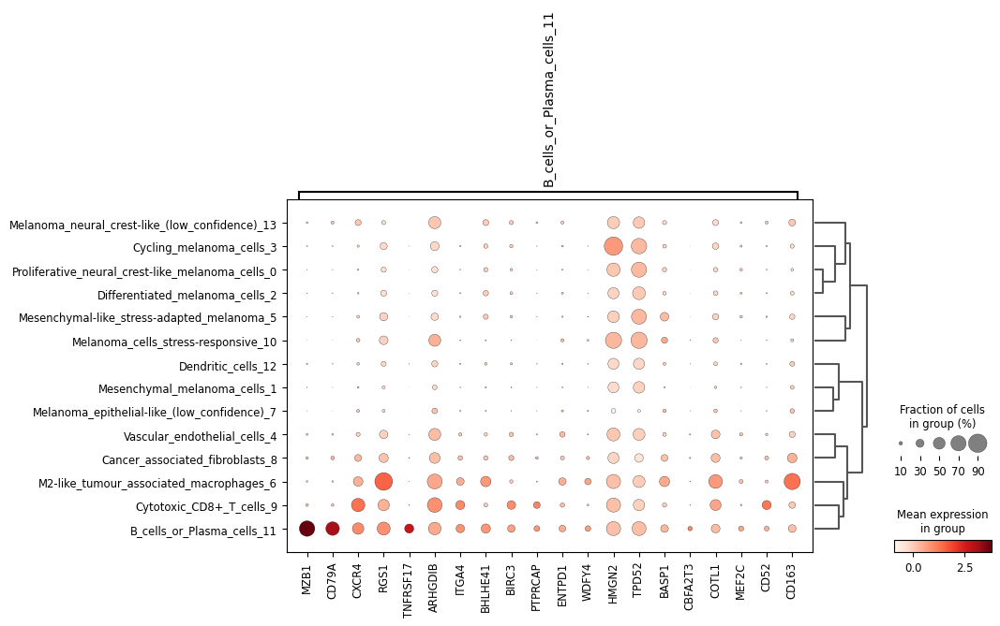

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Dendritic_cells_12


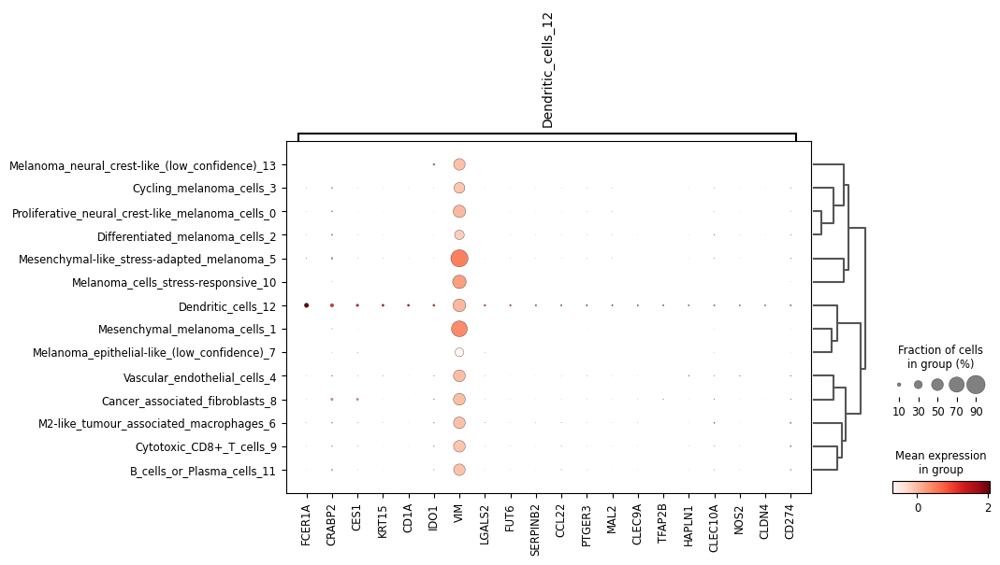

categories: Proliferative_neural_crest-like_melanoma_cells_0, Mesenchymal_melanoma_cells_1, Differentiated_melanoma_cells_2, etc.
var_group_labels: Melanoma_neural_crest-like_(low_confidence)_13


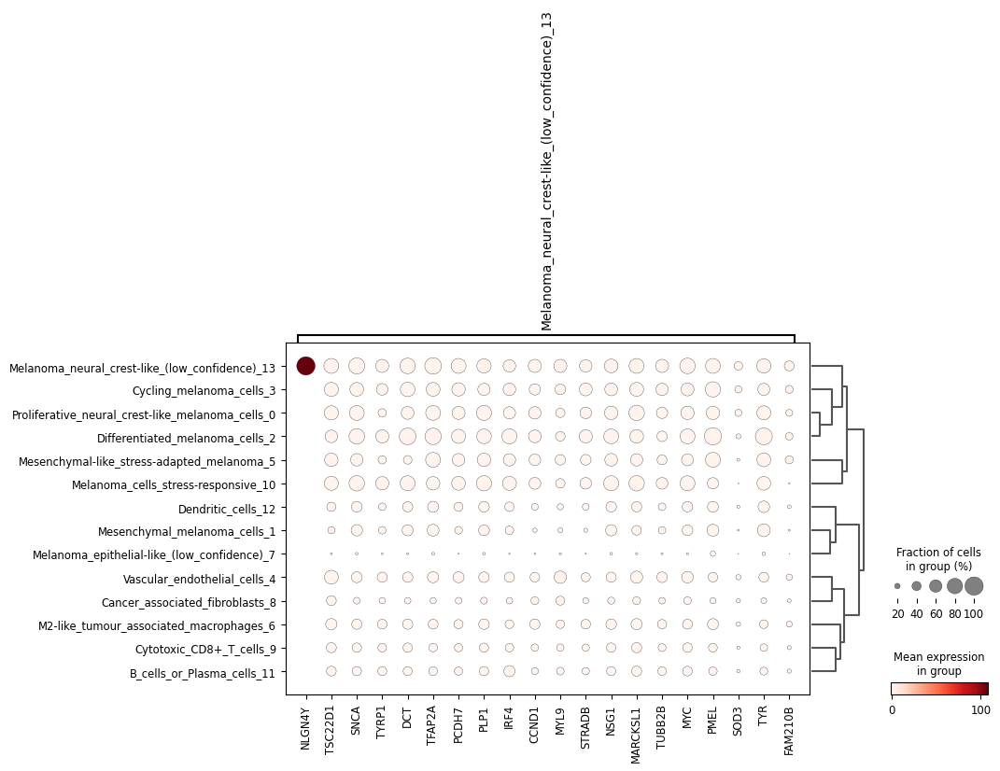

In [280]:
## cycle through the cluster labels and create dotplot for each element
from banksy_utils.annotation_utils import extract_marker_genes_dict

## Ensure that the patch line edge colopur is set to black in global matplotlib rcparams so that the bracket to group genes per cluster is shown
plt.rcParams['patch.edgecolor'] = 'black'

cluster_keys = list(new_labels.keys())
values = list(new_labels.values())

## Compute the dendrogram for clusters
sc.tl.dendrogram(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
    )

for i in range(len(cluster_keys)):
    key = cluster_keys[i]
    subset_cluster= new_labels[key]
    cluster_label = values[i]


    marker_genes_dict=extract_marker_genes_dict(
    adata=adata_spatial, 
    filtered_key=key_filtered, 
    gene_type='raw', 
    groupby = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    subset_cluster= subset_cluster,
    top_n=20
    )
    marker_genes_dict





## Generate dot plot
    with rc_context({"figure.figsize": (10,10)}):
        sc.pl.dotplot(
            adata_spatial, 
            #marker_genes_list,
            marker_genes_dict,
            groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
            dendrogram=True,
            save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_{cluster_label}_dot_plot.png"
            )


In [281]:
cluster_keys

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

## Neighbourhood enrichment analysis

In [282]:
# Set the figure directory to your desired location
sc.settings.figdir = neighbour_path

In [283]:
# Adding spatial coordinates to .obsm
adata_spatial.obsm["spatial"] = adata.obs[["x", "y"]].to_numpy()

In [284]:
sq.gr.spatial_neighbors(adata_spatial)

In [285]:
cluster_key = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
sq.gr.nhood_enrichment(adata_spatial, cluster_key=cluster_key)

100%|██████████| 1000/1000 [00:24<00:00, 41.05/s]


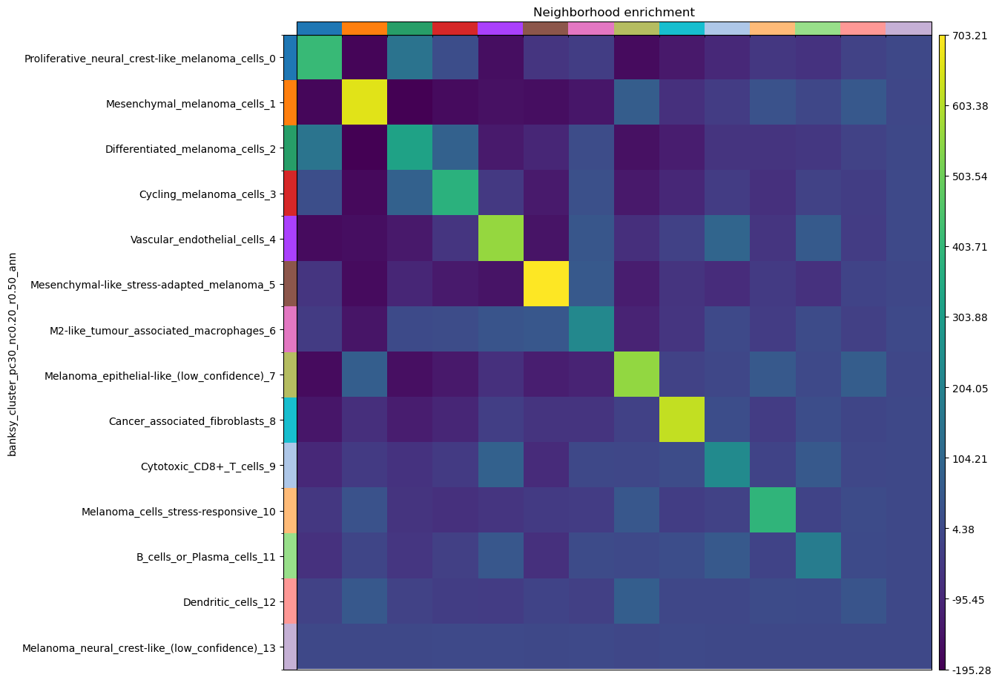

In [286]:
with rc_context({"figure.figsize": (10,10)}):
    sq.pl.nhood_enrichment(
        adata_spatial, 
        cluster_key=cluster_key,
        save=f"neighbourhood_enrichment_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png")

### Moran I's score

In [287]:
# ## Can't create sdata if there are strings in the .uns, the code below will check the object for strings

# bad_uns    = [k for k in adata_spatial.uns.keys()    if not isinstance(k, str)]
# bad_obsm   = [k for k in adata_spatial.obsm.keys()   if not isinstance(k, str)]
# bad_varm   = [k for k in adata_spatial.varm.keys()   if not isinstance(k, str)]
# bad_layers = [k for k in adata_spatial.layers.keys() if not isinstance(k, str)]

# print("uns:", bad_uns)
# print("obsm:", bad_obsm)
# print("varm:", bad_varm)
# print("layers:", bad_layers)


In [288]:
# ## Convert non strings to strings
# if getattr(adata_spatial, "is_view", False):
#     adata_spatial = adata_spatial.copy()

# # 1) uns: remap non-string keys to strings
# if bad_uns:
#     new_uns = {}
#     for k, v in adata_spatial.uns.items():
#         new_uns[str(k)] = v
#     adata_spatial.uns = new_uns  # safe reassignment

# # 2) obsm / varm / layers: rename non-string keys in-place
# def rename_nonstring_mapping(m):
#     # collect renames first to avoid modifying while iterating
#     to_rename = [(k, str(k)) for k in list(m.keys()) if not isinstance(k, str)]
#     for old, new in to_rename:
#         m[new] = m[old]
#         del m[old]

# rename_nonstring_mapping(adata_spatial.obsm)
# rename_nonstring_mapping(adata_spatial.varm)
# rename_nonstring_mapping(adata_spatial.layers)


In [289]:
adata_spatial.obs.rename(columns={"cell type": "cell_type"}, inplace=True)

from spatialdata import SpatialData

# Create SpatialData with a single table (the AnnData)
sdata = SpatialData(tables={"cells": adata_spatial})

print(sdata)


SpatialData object
└── Tables
      └── 'cells': AnnData (435098, 912)
with coordinate systems:



In [290]:
sdata.tables["subsample"] = sc.pp.subsample(adata_spatial, fraction=0.5, copy=True)

In [291]:
adata_subsample = sdata.tables["subsample"]

In [292]:
adata_subsample

AnnData object with n_obs × n_vars = 217549 × 912
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'labels_scaled_gaussian_pc30_nc0.20_r0.50', 'cell_type', 'banksy_cluster_pc30_nc0.20_r0.50', 'banksy_cluster_pc30_nc0.20_r0.50_raw', 'banksy_cluster_pc30_nc0.20_r0.50_ann'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'
    uns: 'banksy_cluster_pc30_nc0.20_r0.50_markers', 'banksy_cluster_pc30_nc0.20_r0.50_markers_raw', 'banksy_cluster_pc30_nc

In [293]:
sq.gr.spatial_neighbors(adata_subsample, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subsample,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subsample.uns["moranI"].head(10)


100%|██████████| 100/100 [12:05<00:00,  7.26s/]


,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
PTGDS_nbr_0,0.951765,0.0,0.000002,0.0,0.009901,0.000005,0.0,0.0,0.010134
PTN_nbr_0,0.933336,0.0,0.000002,0.0,0.009901,0.000005,0.0,0.0,0.010134
FRZB_nbr_0,0.911268,0.0,0.000002,0.0,0.009901,0.000005,0.0,0.0,0.010134
QPCT_nbr_0,0.902800,0.0,0.000002,0.0,0.009901,0.000004,0.0,0.0,0.010134
PMEL_nbr_0,0.900187,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.010134
FBXO7_nbr_0,0.898251,0.0,0.000002,0.0,0.009901,0.000004,0.0,0.0,0.010134
EDNRB_nbr_0,0.897659,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.010134
TYRP1_nbr_0,0.891968,0.0,0.000002,0.0,0.009901,0.000005,0.0,0.0,0.010134
TSC22D1_nbr_0,0.891347,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.010134
IFITM1_nbr_0,0.889355,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.010134


In [294]:
## Store moran I scores as a data frame
moran_scores = adata_subsample.uns["moranI"]
moran_scores = moran_scores.reset_index(names=["Gene"])

## Exclude _nbr_0 and _nbr_1
moran_scores_raw = moran_scores[~moran_scores["Gene"].str.contains("_nbr_0", case=False, na=False)]
moran_scores_raw = moran_scores_raw[~moran_scores_raw["Gene"].str.contains("_nbr_1", case=False, na=False)]

## Filter for genes that have an FDR if less than 10%
moran_scores_raw = moran_scores_raw[moran_scores_raw["pval_sim_fdr_bh"] <= 0.10]

## Write Moran I scores to .csv
moran_scores_raw.to_csv(f"{processed_path}/moran_scores_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.csv")

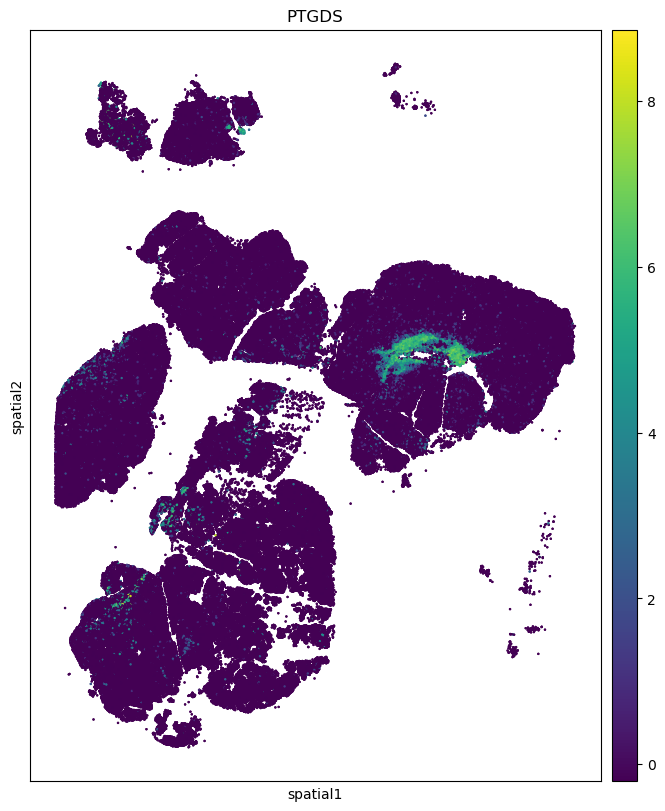

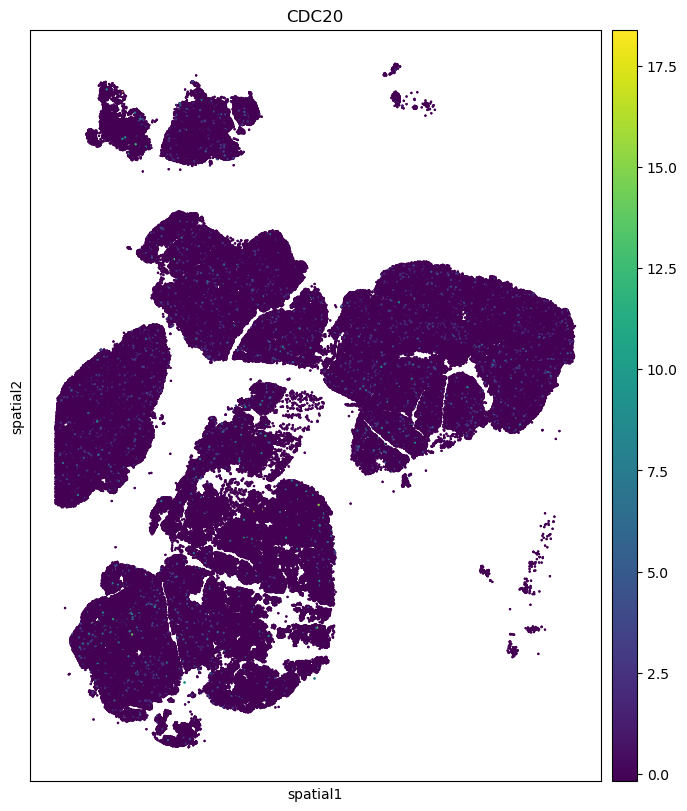

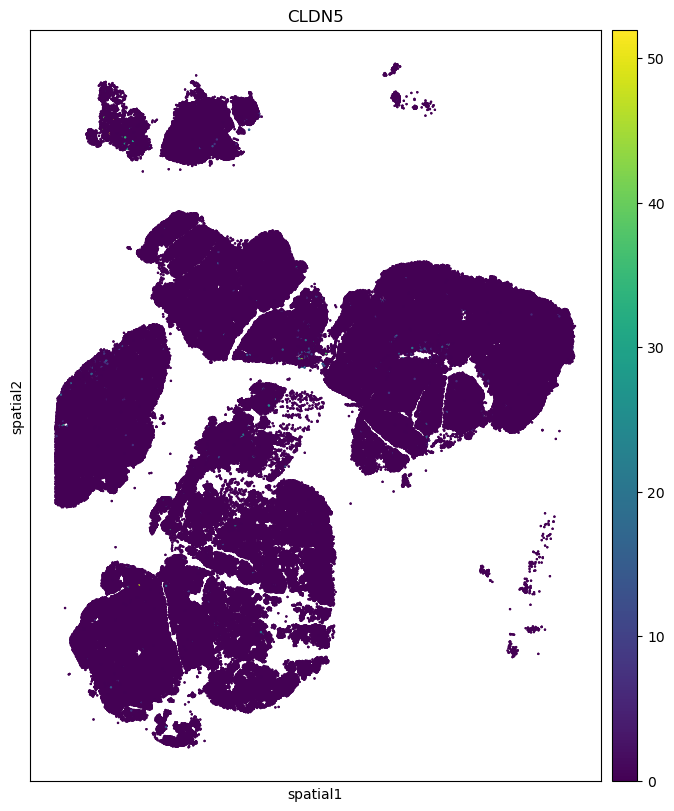

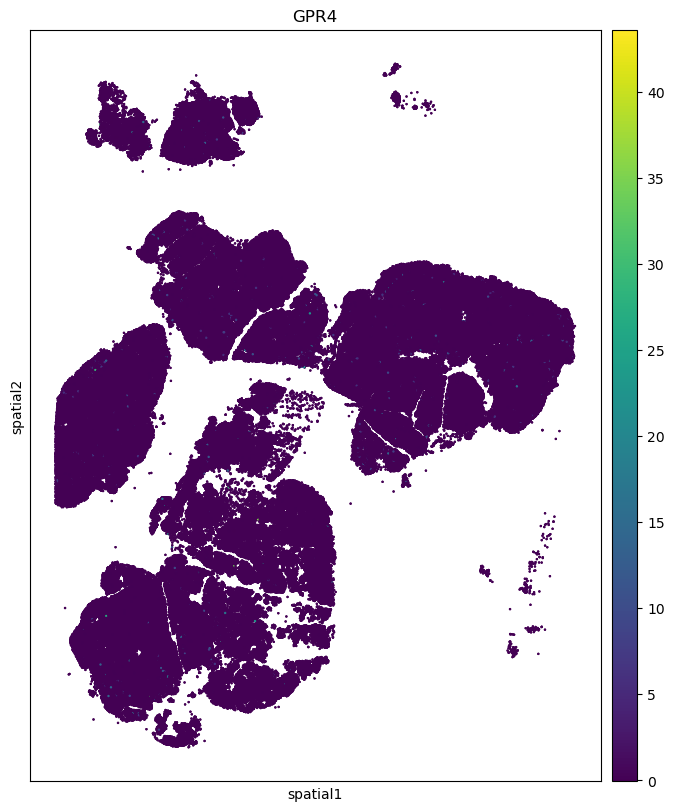

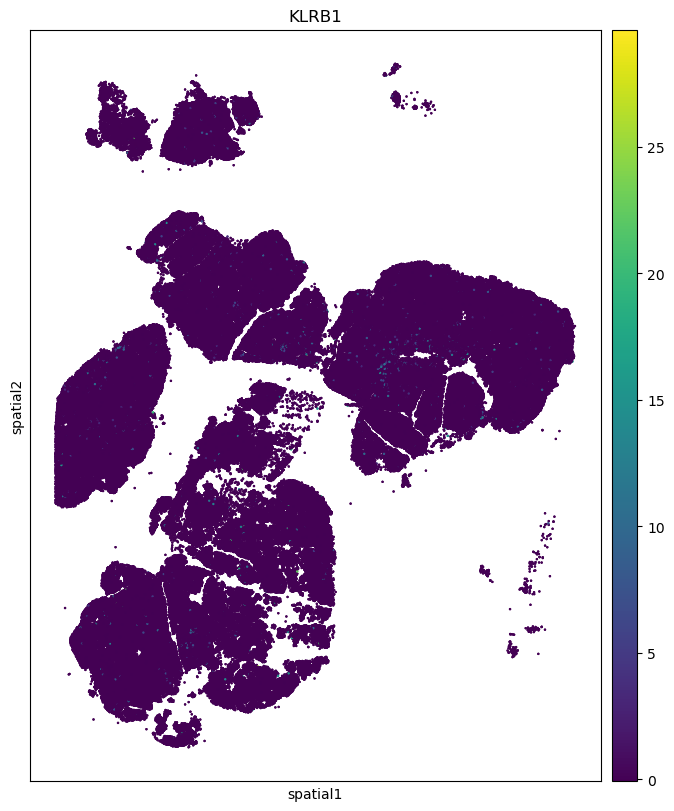

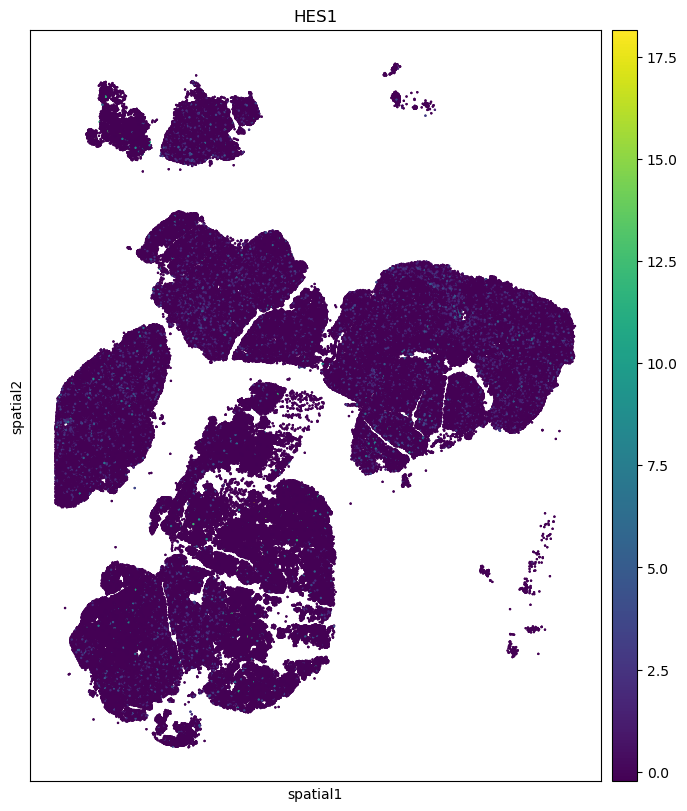

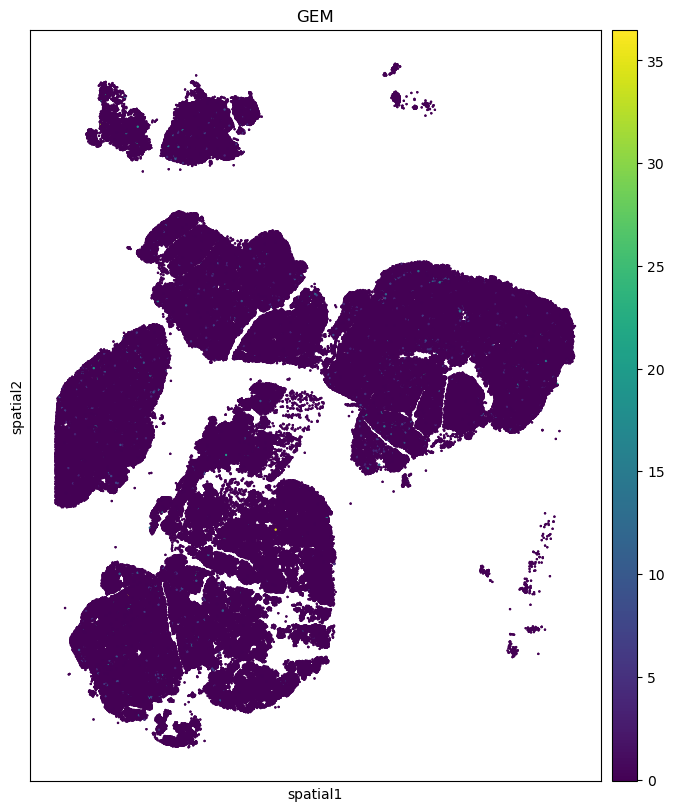

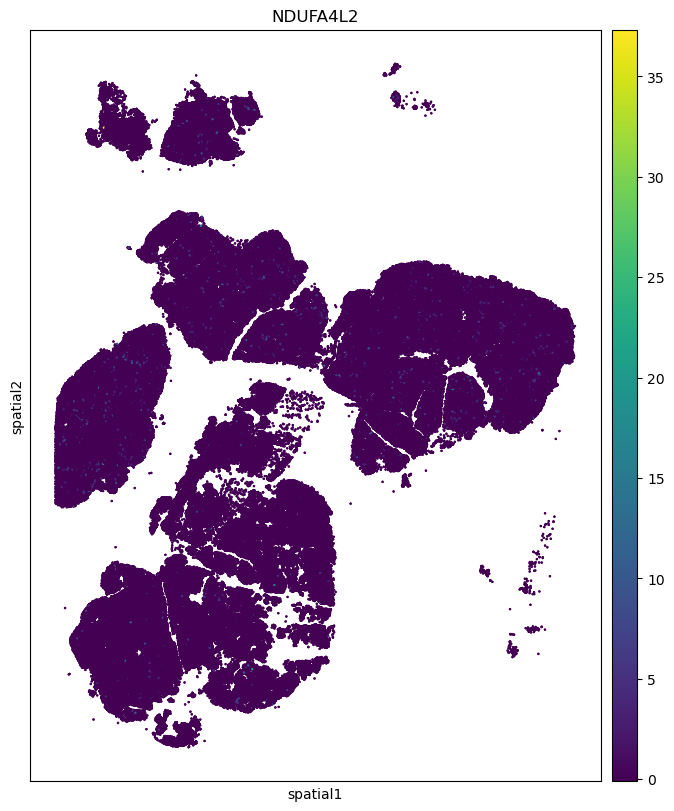

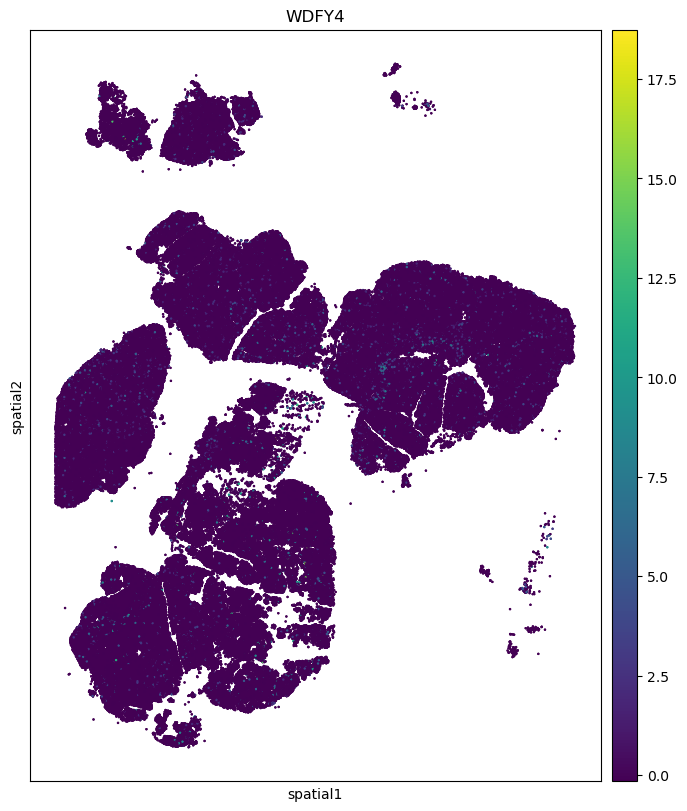

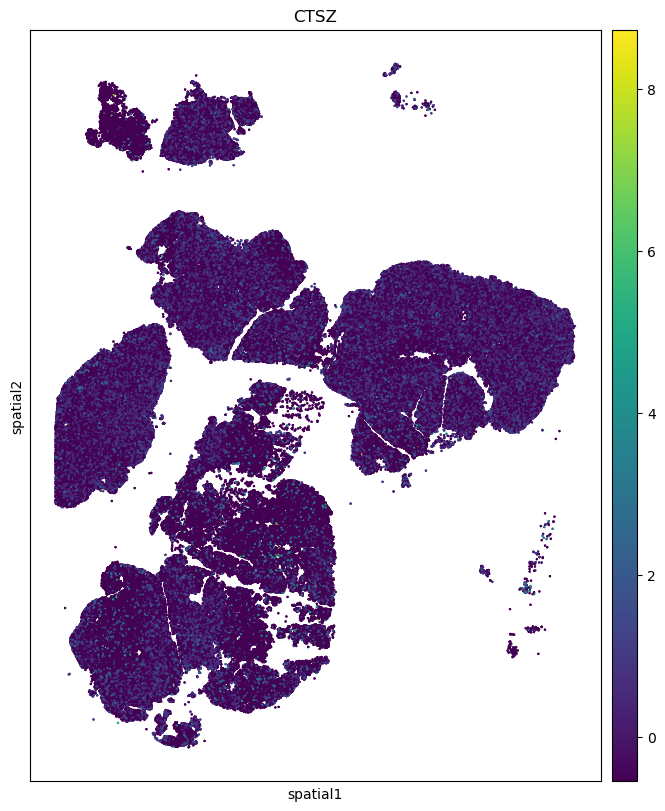

In [295]:
## Plot spatial scatter plots for genes with the top 10 highest Moran I scores

## Create a list of the top scoring genes
top_moran = moran_scores_raw.sort_values(by="pval_sim", ascending=True)
top_moran = top_moran.iloc[:10]
top_moran = list(top_moran['Gene'])
top_moran

for i in top_moran:
    with rc_context({"figure.figsize": (12,8)}):
        sq.pl.spatial_scatter(
            adata_subsample,
            library_id="spatial",
            color=[i],
            shape=None,
            size=2,
            img=False,
            save= f"spatial_scatter_top_moran_I_{i}_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
)

## Compute centrality scores

In [296]:
sq.gr.centrality_scores(adata_subsample, cluster_key=cluster_key)

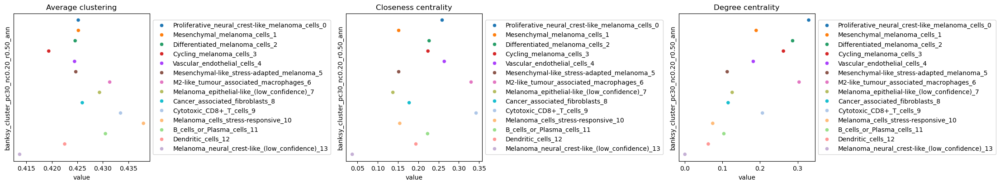

In [297]:
sq.pl.centrality_scores(adata_subsample, cluster_key=cluster_key, figsize=(22, 4))

## Compute co-occurence probability

In [298]:
from spatialdata import SpatialData
sdata = SpatialData()

In [299]:
sdata.tables["subsample"] = sc.pp.subsample(adata_subsample, fraction=0.5, copy=True)

In [300]:
#adata_subsample = sdata.tables["subsample"]
adata_subsample

AnnData object with n_obs × n_vars = 217549 × 912
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'labels_scaled_gaussian_pc30_nc0.20_r0.50', 'cell_type', 'banksy_cluster_pc30_nc0.20_r0.50', 'banksy_cluster_pc30_nc0.20_r0.50_raw', 'banksy_cluster_pc30_nc0.20_r0.50_ann'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'
    uns: 'banksy_cluster_pc30_nc0.20_r0.50_markers', 'banksy_cluster_pc30_nc0.20_r0.50_markers_raw', 'banksy_cluster_pc30_nc

In [301]:
adata.obs.keys()


Index(['nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe',
       'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes',
       'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'labels_scaled_gaussian_pc30_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc30_nc0.20_r0.50',
       'banksy_cluster_pc30_nc0.20_r0.50_raw', 'banksy_cluster_pc30_nc0.20_r0.50_ann'],
      dtype='object')

In [302]:
cluster_keys = list(new_labels.keys())

In [303]:
cluster_keys

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

In [304]:
cluster_key_label = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw"

In [ ]:
## Calculate and plot the co-occurence of clusters
sq.gr.co_occurrence(
    adata_subsample,
    cluster_key=cluster_key_label
    )


for i in cluster_keys:     
    cluster_number = str(i)
     
    with rc_context({"figure.figsize": (12,12)}):
        sq.pl.co_occurrence(
            adata_subsample,
            cluster_key=cluster_key_label,
            clusters=i,
            figsize=(10, 10),
            save=f"co-occurence_cluster_{cluster_number}_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
            )

with rc_context({"figure.figsize": (12,8)}):
    sq.pl.spatial_scatter(
        adata_subsample,
        color=cluster_key_label,
        shape=None,
        size=2,
        save=f"spatial_cluster_scatter_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
        )

 15%|█▌        | 880/5778 [12:47<1:15:15,  1.08/s]

## Spatial expression for genes of interest

In [ ]:
# Set the figure directory to your desired location
sc.settings.figdir = spatial_scatter_path

goi_list = [
    "DSG2",
    "SERPINE1",
    "DKK1",
    "FOXP3", 
    "GZMB",
    "ITGAE",
    "ITGA1",
    "ITGA4",
    "ITGA5",
    "TPD52",
    "TPD52L1",
    "TPD52L2",
    "SELE", 
    "SELL", 
    "SELP",
    "FUT6", 
    "FUT7",
    "VCAM1",
    "ICAM1",
    "PDCD1", 
    "CD274", 
    "CTLA4",
]

# Set the figure directory to your desired location
sc.settings.figdir = spatial_scatter_path

for gene in goi_list:
    sq.pl.spatial_scatter(
        adata_subsample,
        library_id="spatial",
        color=[gene],
        shape=None,
        size=2,
        img=False,
        save= f"spatial_scatter_{gene}_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
)